# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
import numpy as np

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

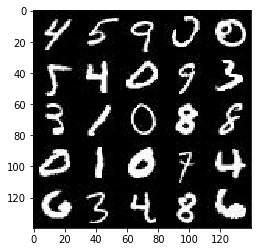

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

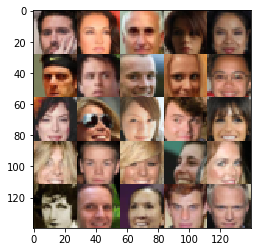

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

/home/vladhc/.local/bin/miniconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


TensorFlow Version: 1.7.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_input = tf.placeholder(tf.float32,
                                shape=(None, image_height, image_width, image_channels),
                                name='real_images_input')
    z = tf.placeholder(tf.float32,
                       shape=(None, z_dim),
                       name='z_input')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return real_input, z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
# Implementation of Minibatch Discrimination
def minibatch_discrimination(input_layer, num_kernels, dim_per_kernel=5):
    batch_size = input_layer.shape[0]
    num_features = input_layer.shape[1]
    W = tf.get_variable('W',
                        shape=[num_features, num_kernels*dim_per_kernel],
                        initializer=tf.contrib.layers.xavier_initializer())
    b = tf.get_variable('b',
                        shape=[num_kernels],
                        initializer=tf.constant_initializer(0.0))
    activation = tf.matmul(input_layer, W)
    activation = tf.reshape(activation, [batch_size, num_kernels, dim_per_kernel])
    tmp1 = tf.expand_dims(activation, 3)
    tmp2 = tf.transpose(activation, perm=[1, 2, 0])
    tmp2 = tf.expand_dims(tmp2, 0)
    abs_diff = tf.reduce_sum(tf.abs(tmp1 - tmp2), reduction_indices=[2])
    f = tf.reduce_sum(tf.exp(-abs_diff), reduction_indices=[2])
    f = f + b
    return f

In [8]:
from collections import namedtuple

# Used to simplify hyperparameter tuning
DParams = namedtuple('DParams', ['alpha', 'dropout_rate', 'conv_filters', 'minibatch_kernels', 'dense_layers'])

# Some default params to make tests run
d_params = DParams(
    alpha=0.2,
    dropout_rate=0.3,
    conv_filters=[64, 128, 256],
    minibatch_kernels=100,
    dense_layers=[100],
)

def discriminator(images, reuse=False, batch_size=64, do_minibatch_discrimination=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    alpha = d_params.alpha
    dropout_rate = d_params.dropout_rate
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # batch x 28 x 28 x chan
        
        x = tf.layers.conv2d(images,
                             d_params.conv_filters[0], 5,
                             strides=2,
                             padding='SAME')
        # first layer has no batch normalization, no dropout
        x = tf.nn.leaky_relu(x, alpha)
        
        # batch x 14 x 14 x 64
        
        x = tf.layers.conv2d(x,
                             d_params.conv_filters[1], 5,
                             strides=2,
                             padding='SAME',
                             use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.nn.leaky_relu(x, alpha)
        x = tf.layers.dropout(x, rate=dropout_rate, training=True)
        
        # batch x 7 x 7 x 128
        
        x = tf.layers.conv2d(x,
                             d_params.conv_filters[2], 5,
                             strides=1,
                             padding='VALID',
                             use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.nn.leaky_relu(x, alpha)
        x = tf.layers.dropout(x, rate=dropout_rate, training=True)
        
        # batch x 3 x 3 x 256
        
        x = tf.reshape(x, [batch_size, x.shape[1] * x.shape[2] * x.shape[3]])
        
        # batch x features
        if do_minibatch_discrimination:
            m_d = minibatch_discrimination(x, d_params.minibatch_kernels)
        else:
            m_d = tf.zeros([batch_size, 1])
        
        for units in d_params.dense_layers:
            x = tf.layers.dense(x, units, use_bias=False)
            x = tf.layers.batch_normalization(x, training=True)
            x = tf.nn.leaky_relu(x, alpha)
        
        x = tf.concat([x, m_d], 1)
        
        x = tf.layers.dense(x, 1)
        
        outputs = tf.nn.sigmoid(x)

    return outputs, x


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [9]:
# Used to simplify hyperparameter tuning
GParams = namedtuple('GParams', ['alpha', 'dropout_rate', 'conv_filters', 'dense_layers'])

# Some default params to make tests run
g_params = GParams(
    alpha=0.2,
    dropout_rate=0,
    conv_filters=[512, 256, 128],
    dense_layers=[100],
)

def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    alpha = g_params.alpha
    dropout_rate = g_params.dropout_rate
    
    with tf.variable_scope('generator', reuse=(not is_train)):
        
        # Fully-Connected
        x = z
        for idx in range(len(g_params.dense_layers)):
            units = g_params.dense_layers[idx]
            do_batch_norm = idx > 0
            x = tf.layers.dense(x, units, use_bias=(not do_batch_norm))
            if do_batch_norm:
                x = tf.layers.batch_normalization(x, training=is_train)
            x = tf.nn.leaky_relu(x, alpha)
        
        # Pseudo conv layers
        flat_shape = [-1, 2, 2, g_params.conv_filters[0]]
        x = tf.layers.dense(x,
                            flat_shape[1] * flat_shape[2] * flat_shape[3],
                            use_bias=False)
        x = tf.reshape(x, flat_shape)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.nn.leaky_relu(x, alpha)
        if dropout_rate > 0:
            x = tf.layers.dropout(x, rate=dropout_rate, training=True) # training=True is done intentionaly
                
        # batch x 3 x 3 x 1024
        
        x = tf.layers.conv2d_transpose(x,
                                       g_params.conv_filters[1], 5,
                                       strides=2,
                                       padding='VALID',
                                       use_bias=False,
                                       kernel_initializer=tf.contrib.layers.xavier_initializer())
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.nn.leaky_relu(x, alpha)
        if dropout_rate > 0:
            x = tf.layers.dropout(x, rate=dropout_rate, training=True) # training=True is done intentionaly
            
        # batch x 8 x 8 x 128
        
        x = tf.layers.conv2d_transpose(x,
                                       g_params.conv_filters[2], 5,
                                       strides=2,
                                       padding='SAME',
                                       use_bias=False,
                                       kernel_initializer=tf.contrib.layers.xavier_initializer())
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.nn.leaky_relu(x, alpha)
        if dropout_rate > 0:
            x = tf.layers.dropout(x, rate=dropout_rate, training=True) # training=True is done intentionaly

        # batch x 16 x 16 x 64
        
        x = tf.layers.conv2d_transpose(x,
                                       out_channel_dim, 5,
                                       strides=2,
                                       padding='SAME',
                                       kernel_initializer=tf.contrib.layers.xavier_initializer())
        x = tf.tanh(x)            
    
    return x


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Instructions for updating:
Use the retry module or similar alternatives.
Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim, batch_size=64):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :param flip_prob: Probability of label flipping in the descriminator loss
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    input_fake = generator(input_z, out_channel_dim, is_train=True)
    
    d_real_out, d_real_logits = discriminator(input_real, reuse=False, batch_size=batch_size, do_minibatch_discrimination=True)
    d_fake_out, d_fake_logits = discriminator(input_fake, reuse=True, batch_size=batch_size, do_minibatch_discrimination=True)
    
    shape = tf.shape(d_real_logits)
    d_real_labels = tf.random_uniform(shape, minval=0.9, maxval=1.1)
    # Do not smooth labels for images
    # d_fake_labels = tf.random_uniform(shape, minval=0, maxval=0.2)
    d_fake_labels = tf.zeros_like(d_fake_logits)
    
    # Make the labels the noisy for the discriminator:
    # Occasionally flip the labels when training the discriminator
    flip_prob=0.05
    should_keep_value = tf.random_uniform(shape) > flip_prob
    d_real_labels_rand = tf.where(should_keep_value, d_real_labels, d_fake_labels)
    d_fake_labels_rand = tf.where(should_keep_value, d_fake_labels, d_real_labels)

    # Uncomment to disable label smoothing and flipping
    #d_real_labels = tf.ones_like(d_real_logits)
    #d_fake_labels = tf.zeros_like(d_fake_logits)
    #d_real_labels_rand = d_real_labels
    #d_fake_labels_rand = d_fake_labels
    
    d_real_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            labels=d_real_labels_rand,
            logits=d_real_logits))
    
    d_fake_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            labels=d_fake_labels_rand,
            logits=d_fake_logits))
        
    d_loss = d_real_loss + d_fake_loss
    
    gen_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            labels=tf.ones_like(d_fake_logits),
            logits=d_fake_logits))
    
    return d_loss, gen_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    d_vars = tf.trainable_variables(scope='discriminator')
    g_vars = tf.trainable_variables(scope='generator')
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [12]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [15]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """

    print_every = 50
    show_every = 500
    show_images_count = 25
    
    _, width, height, channels = data_shape
    real_input, z, learning_rate_placeholder = model_inputs(width, height, channels, z_dim)
    d_loss_op, g_loss_op = model_loss(real_input, z, channels, batch_size=batch_size)
    d_train, g_train = model_opt(d_loss_op, g_loss_op, learning_rate_placeholder, beta1)
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                steps += 1
                
                # Real images, which we are trying to fake, are in range [-0.5, 0.5]
                # But fake images are in the range (-1, 1).
                # So, we have to match them.
                batch_images = batch_images * 2
                
                # Tain on gaussian distribution
                # batch_z = np.random.normal(loc=0.0, scale=1.0, size=(batch_size, z_dim))
                
                batch_z = np.random.uniform(-1, 1, size=[batch_size, z_dim])
                
                feed_dict = {
                    real_input: batch_images,
                    z: batch_z,
                    learning_rate_placeholder: learning_rate,
                }
                
                _, d_loss = sess.run([d_train, d_loss_op], feed_dict=feed_dict)
                _, g_loss = sess.run([g_train, g_loss_op], feed_dict=feed_dict)
                
                if steps % print_every == 0:
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(d_loss),
                          "Generator Loss: {:.4f}".format(g_loss))

                if steps % show_every == 0:
                    show_generator_output(sess, show_images_count, z, channels, data_image_mode)

        print("Final images:")
        show_generator_output(sess, show_images_count, z, channels, data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.8450... Generator Loss: 9.9191
Epoch 1/2... Discriminator Loss: 0.8482... Generator Loss: 7.0437


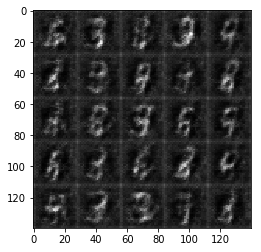

Epoch 1/2... Discriminator Loss: 0.7375... Generator Loss: 6.7713
Epoch 1/2... Discriminator Loss: 1.2153... Generator Loss: 7.0290


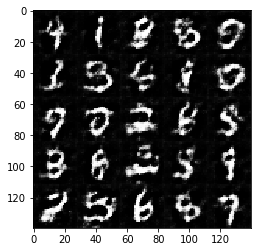

Epoch 1/2... Discriminator Loss: 0.7464... Generator Loss: 2.7322
Epoch 1/2... Discriminator Loss: 0.6356... Generator Loss: 2.0956


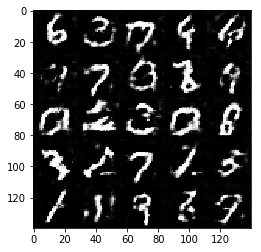

Epoch 1/2... Discriminator Loss: 0.9446... Generator Loss: 1.8790
Epoch 1/2... Discriminator Loss: 0.7584... Generator Loss: 2.5287


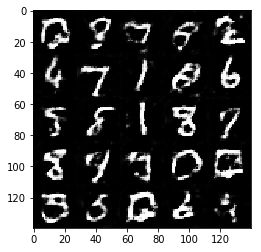

Epoch 1/2... Discriminator Loss: 0.8315... Generator Loss: 3.7509
Epoch 1/2... Discriminator Loss: 0.8834... Generator Loss: 3.8732


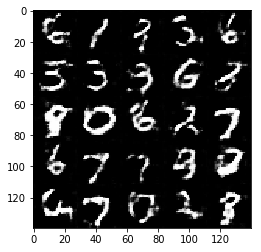

Epoch 1/2... Discriminator Loss: 0.4408... Generator Loss: 2.7139
Epoch 1/2... Discriminator Loss: 0.9738... Generator Loss: 1.3473


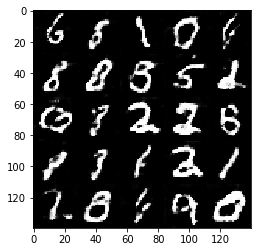

Epoch 1/2... Discriminator Loss: 1.1767... Generator Loss: 1.2387
Epoch 1/2... Discriminator Loss: 0.6953... Generator Loss: 2.4351


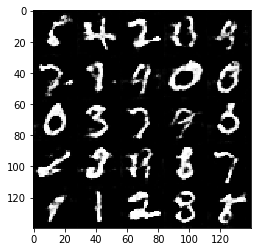

Epoch 1/2... Discriminator Loss: 1.0792... Generator Loss: 1.5434
Epoch 1/2... Discriminator Loss: 0.7313... Generator Loss: 2.9588


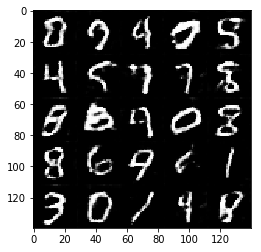

Epoch 1/2... Discriminator Loss: 1.6694... Generator Loss: 0.5040
Epoch 1/2... Discriminator Loss: 0.7138... Generator Loss: 2.2267


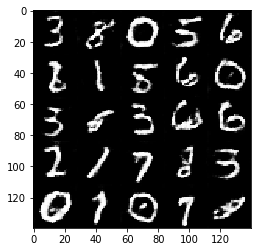

Epoch 2/2... Discriminator Loss: 1.1870... Generator Loss: 3.6908
Epoch 2/2... Discriminator Loss: 0.6679... Generator Loss: 2.7108


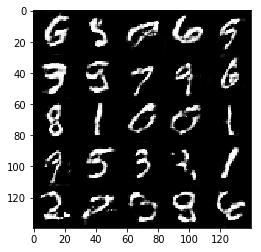

Epoch 2/2... Discriminator Loss: 0.6099... Generator Loss: 3.6048
Epoch 2/2... Discriminator Loss: 0.6819... Generator Loss: 3.6107


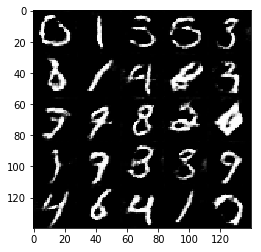

Epoch 2/2... Discriminator Loss: 0.7233... Generator Loss: 2.6619
Epoch 2/2... Discriminator Loss: 0.7707... Generator Loss: 2.2299


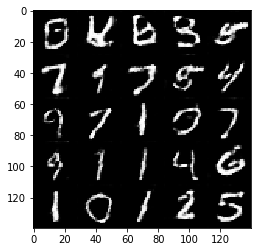

Epoch 2/2... Discriminator Loss: 0.6863... Generator Loss: 3.1349
Epoch 2/2... Discriminator Loss: 0.9612... Generator Loss: 1.4401


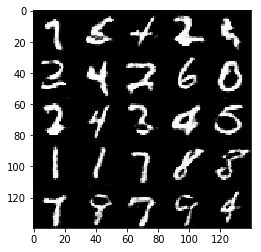

Epoch 2/2... Discriminator Loss: 0.7577... Generator Loss: 1.9631
Epoch 2/2... Discriminator Loss: 1.0711... Generator Loss: 1.4296


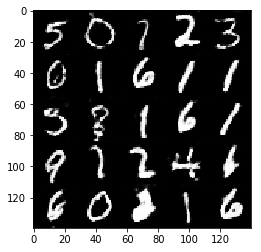

Epoch 2/2... Discriminator Loss: 0.7611... Generator Loss: 1.7936
Epoch 2/2... Discriminator Loss: 0.8442... Generator Loss: 2.3684


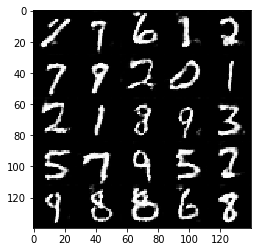

Epoch 2/2... Discriminator Loss: 0.7479... Generator Loss: 1.7545
Epoch 2/2... Discriminator Loss: 0.6991... Generator Loss: 2.7301


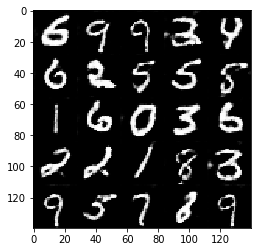

Epoch 2/2... Discriminator Loss: 0.8507... Generator Loss: 2.1248
Epoch 2/2... Discriminator Loss: 0.7548... Generator Loss: 4.3812


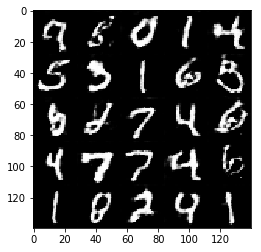

Epoch 2/2... Discriminator Loss: 0.8003... Generator Loss: 3.1648
Epoch 2/2... Discriminator Loss: 0.8184... Generator Loss: 1.9594


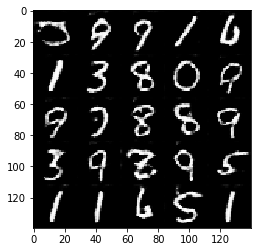

Epoch 2/2... Discriminator Loss: 1.1224... Generator Loss: 5.5637
Final images:


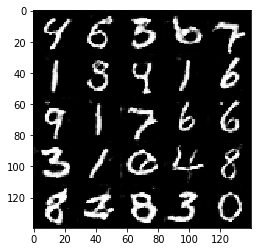

In [113]:
batch_size = 64
z_dim = 10
learning_rate = 0.0005
beta1 = 0.2

d_params = DParams(
    alpha=0.2, dropout_rate=0.1, minibatch_kernels=300, # dropout-rate
    conv_filters=[64, 128, 256],
    dense_layers=[], # less dense layers in D
)

g_params = GParams(
    alpha=0.2, dropout_rate=0,
    conv_filters=[512, 64, 64],
    dense_layers=[64, 128, 256, 512],
)

epochs = 2
mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 1.8470... Generator Loss: 0.3493
Epoch 1/5... Discriminator Loss: 1.5801... Generator Loss: 0.3982
Epoch 1/5... Discriminator Loss: 1.4783... Generator Loss: 0.5929
Epoch 1/5... Discriminator Loss: 1.3141... Generator Loss: 0.5499
Epoch 1/5... Discriminator Loss: 1.1547... Generator Loss: 0.6441
Epoch 1/5... Discriminator Loss: 0.9969... Generator Loss: 0.8112
Epoch 1/5... Discriminator Loss: 0.8939... Generator Loss: 0.7705
Epoch 1/5... Discriminator Loss: 0.7596... Generator Loss: 0.9473
Epoch 1/5... Discriminator Loss: 0.8628... Generator Loss: 1.0842
Epoch 1/5... Discriminator Loss: 0.7380... Generator Loss: 1.1997


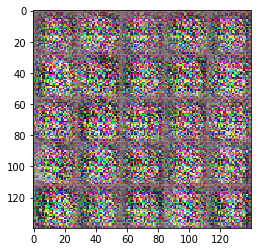

Epoch 1/5... Discriminator Loss: 1.1459... Generator Loss: 1.2516
Epoch 1/5... Discriminator Loss: 1.0483... Generator Loss: 1.3391
Epoch 1/5... Discriminator Loss: 1.1736... Generator Loss: 1.1015
Epoch 1/5... Discriminator Loss: 1.2022... Generator Loss: 1.0939
Epoch 1/5... Discriminator Loss: 1.2194... Generator Loss: 1.1230
Epoch 1/5... Discriminator Loss: 1.1690... Generator Loss: 1.1309
Epoch 1/5... Discriminator Loss: 1.0749... Generator Loss: 1.2881
Epoch 1/5... Discriminator Loss: 1.1262... Generator Loss: 1.1184
Epoch 1/5... Discriminator Loss: 1.1204... Generator Loss: 1.1984
Epoch 1/5... Discriminator Loss: 1.2223... Generator Loss: 1.2122


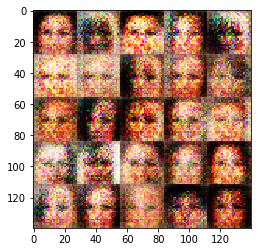

Epoch 1/5... Discriminator Loss: 1.2328... Generator Loss: 1.0107
Epoch 1/5... Discriminator Loss: 0.9334... Generator Loss: 1.1476
Epoch 1/5... Discriminator Loss: 1.3239... Generator Loss: 0.9204
Epoch 1/5... Discriminator Loss: 1.2603... Generator Loss: 1.1006
Epoch 1/5... Discriminator Loss: 1.2495... Generator Loss: 1.0301
Epoch 1/5... Discriminator Loss: 1.1692... Generator Loss: 1.0956
Epoch 1/5... Discriminator Loss: 1.3681... Generator Loss: 0.8962
Epoch 1/5... Discriminator Loss: 1.2195... Generator Loss: 0.9129
Epoch 1/5... Discriminator Loss: 1.2336... Generator Loss: 0.9688
Epoch 1/5... Discriminator Loss: 1.3078... Generator Loss: 1.0432


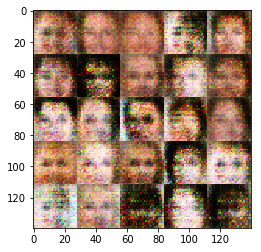

Epoch 1/5... Discriminator Loss: 1.2842... Generator Loss: 0.9039
Epoch 1/5... Discriminator Loss: 1.2762... Generator Loss: 0.9117
Epoch 1/5... Discriminator Loss: 1.2865... Generator Loss: 0.9322
Epoch 1/5... Discriminator Loss: 1.2663... Generator Loss: 1.0719
Epoch 1/5... Discriminator Loss: 1.3801... Generator Loss: 0.8658
Epoch 1/5... Discriminator Loss: 1.2807... Generator Loss: 0.9043
Epoch 1/5... Discriminator Loss: 1.2645... Generator Loss: 0.9701
Epoch 1/5... Discriminator Loss: 1.2360... Generator Loss: 0.9731
Epoch 1/5... Discriminator Loss: 1.2774... Generator Loss: 0.8856
Epoch 1/5... Discriminator Loss: 1.3141... Generator Loss: 0.8226


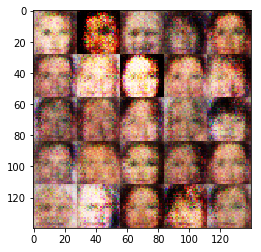

Epoch 1/5... Discriminator Loss: 1.2648... Generator Loss: 0.9329
Epoch 1/5... Discriminator Loss: 1.2783... Generator Loss: 0.9347
Epoch 1/5... Discriminator Loss: 1.2837... Generator Loss: 0.7714
Epoch 1/5... Discriminator Loss: 1.2799... Generator Loss: 0.9769
Epoch 1/5... Discriminator Loss: 1.3432... Generator Loss: 0.8322
Epoch 1/5... Discriminator Loss: 1.3899... Generator Loss: 0.9270
Epoch 1/5... Discriminator Loss: 1.3955... Generator Loss: 0.9642
Epoch 1/5... Discriminator Loss: 1.2737... Generator Loss: 0.9056
Epoch 1/5... Discriminator Loss: 1.1946... Generator Loss: 0.9518
Epoch 1/5... Discriminator Loss: 1.3158... Generator Loss: 0.8593


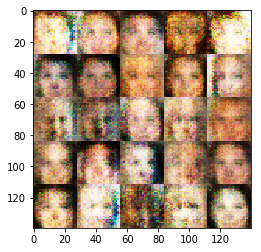

Epoch 1/5... Discriminator Loss: 1.3379... Generator Loss: 0.9112
Epoch 1/5... Discriminator Loss: 1.3136... Generator Loss: 0.8578
Epoch 1/5... Discriminator Loss: 1.3834... Generator Loss: 1.0461
Epoch 1/5... Discriminator Loss: 1.3877... Generator Loss: 0.8149
Epoch 1/5... Discriminator Loss: 1.4739... Generator Loss: 0.8004
Epoch 1/5... Discriminator Loss: 1.2712... Generator Loss: 0.9055
Epoch 1/5... Discriminator Loss: 1.1687... Generator Loss: 0.8529
Epoch 1/5... Discriminator Loss: 1.2404... Generator Loss: 0.8998
Epoch 1/5... Discriminator Loss: 1.3715... Generator Loss: 0.7639
Epoch 1/5... Discriminator Loss: 1.3774... Generator Loss: 0.9930


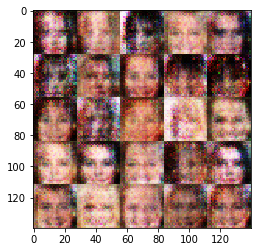

Epoch 1/5... Discriminator Loss: 1.2890... Generator Loss: 0.8532
Epoch 1/5... Discriminator Loss: 1.3289... Generator Loss: 0.8307
Epoch 1/5... Discriminator Loss: 1.1463... Generator Loss: 1.0340
Epoch 1/5... Discriminator Loss: 1.3025... Generator Loss: 0.8750
Epoch 1/5... Discriminator Loss: 1.3524... Generator Loss: 0.9017
Epoch 1/5... Discriminator Loss: 1.3060... Generator Loss: 0.8830
Epoch 1/5... Discriminator Loss: 1.3522... Generator Loss: 0.8865
Epoch 1/5... Discriminator Loss: 1.3225... Generator Loss: 0.8800
Epoch 1/5... Discriminator Loss: 1.1697... Generator Loss: 0.7711
Epoch 1/5... Discriminator Loss: 1.2883... Generator Loss: 0.9605


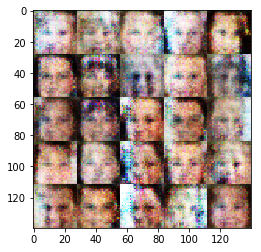

Epoch 1/5... Discriminator Loss: 1.1939... Generator Loss: 0.9895
Epoch 1/5... Discriminator Loss: 1.2624... Generator Loss: 0.9279
Epoch 1/5... Discriminator Loss: 1.2380... Generator Loss: 0.8465
Epoch 1/5... Discriminator Loss: 1.4454... Generator Loss: 0.9836
Epoch 1/5... Discriminator Loss: 1.3942... Generator Loss: 0.9856
Epoch 1/5... Discriminator Loss: 1.3690... Generator Loss: 0.7219
Epoch 1/5... Discriminator Loss: 1.3560... Generator Loss: 0.8484
Epoch 1/5... Discriminator Loss: 1.3862... Generator Loss: 0.7378
Epoch 1/5... Discriminator Loss: 1.4569... Generator Loss: 0.8189
Epoch 1/5... Discriminator Loss: 1.2938... Generator Loss: 0.7390


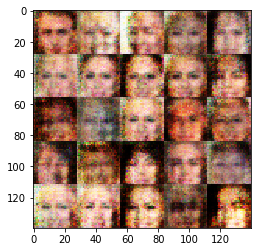

Epoch 1/5... Discriminator Loss: 1.1584... Generator Loss: 0.8171
Epoch 1/5... Discriminator Loss: 1.3607... Generator Loss: 0.7086
Epoch 1/5... Discriminator Loss: 1.3974... Generator Loss: 0.8550
Epoch 1/5... Discriminator Loss: 1.3212... Generator Loss: 0.7783
Epoch 1/5... Discriminator Loss: 1.1007... Generator Loss: 0.7877
Epoch 1/5... Discriminator Loss: 1.4370... Generator Loss: 0.9610
Epoch 1/5... Discriminator Loss: 1.2585... Generator Loss: 0.7882
Epoch 1/5... Discriminator Loss: 1.3479... Generator Loss: 0.7737
Epoch 1/5... Discriminator Loss: 1.4165... Generator Loss: 0.8520
Epoch 1/5... Discriminator Loss: 1.3098... Generator Loss: 0.9079


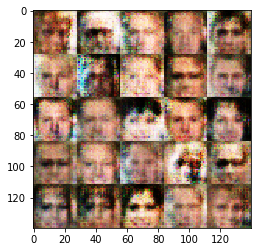

Epoch 1/5... Discriminator Loss: 1.2841... Generator Loss: 0.8196
Epoch 1/5... Discriminator Loss: 1.1947... Generator Loss: 0.9318
Epoch 1/5... Discriminator Loss: 1.3128... Generator Loss: 0.8472
Epoch 1/5... Discriminator Loss: 1.3478... Generator Loss: 0.8440
Epoch 1/5... Discriminator Loss: 1.3069... Generator Loss: 0.8525
Epoch 1/5... Discriminator Loss: 1.2110... Generator Loss: 0.8364
Epoch 1/5... Discriminator Loss: 1.1781... Generator Loss: 0.8174
Epoch 1/5... Discriminator Loss: 1.1999... Generator Loss: 0.8516
Epoch 1/5... Discriminator Loss: 1.3595... Generator Loss: 0.7252
Epoch 1/5... Discriminator Loss: 1.3085... Generator Loss: 0.8708


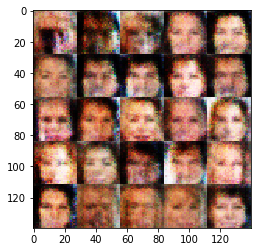

Epoch 1/5... Discriminator Loss: 1.4243... Generator Loss: 0.8320
Epoch 1/5... Discriminator Loss: 1.3617... Generator Loss: 0.7533
Epoch 1/5... Discriminator Loss: 1.3937... Generator Loss: 0.7984
Epoch 1/5... Discriminator Loss: 1.2811... Generator Loss: 0.8303
Epoch 1/5... Discriminator Loss: 1.2392... Generator Loss: 0.9169
Epoch 1/5... Discriminator Loss: 1.2950... Generator Loss: 0.9177
Epoch 1/5... Discriminator Loss: 1.4841... Generator Loss: 0.8026
Epoch 1/5... Discriminator Loss: 1.2864... Generator Loss: 0.8517
Epoch 1/5... Discriminator Loss: 1.3023... Generator Loss: 0.9487
Epoch 1/5... Discriminator Loss: 1.3581... Generator Loss: 0.7230


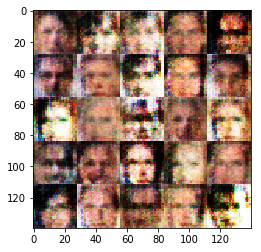

Epoch 1/5... Discriminator Loss: 1.4444... Generator Loss: 0.6846
Epoch 1/5... Discriminator Loss: 1.3409... Generator Loss: 0.8361
Epoch 1/5... Discriminator Loss: 1.3635... Generator Loss: 0.7481
Epoch 1/5... Discriminator Loss: 1.3707... Generator Loss: 0.9479
Epoch 1/5... Discriminator Loss: 1.3145... Generator Loss: 0.7487
Epoch 1/5... Discriminator Loss: 1.2779... Generator Loss: 1.0146
Epoch 1/5... Discriminator Loss: 1.3774... Generator Loss: 0.6566
Epoch 1/5... Discriminator Loss: 1.3977... Generator Loss: 0.7547
Epoch 1/5... Discriminator Loss: 1.2781... Generator Loss: 0.8978
Epoch 1/5... Discriminator Loss: 1.3740... Generator Loss: 0.6999


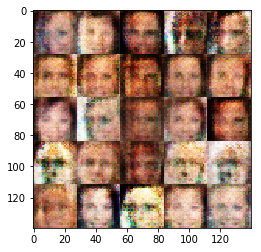

Epoch 1/5... Discriminator Loss: 1.3299... Generator Loss: 0.9049
Epoch 1/5... Discriminator Loss: 1.3626... Generator Loss: 0.9707
Epoch 1/5... Discriminator Loss: 1.3644... Generator Loss: 0.8569
Epoch 1/5... Discriminator Loss: 1.3964... Generator Loss: 0.7306
Epoch 1/5... Discriminator Loss: 1.3400... Generator Loss: 0.7719
Epoch 1/5... Discriminator Loss: 1.2581... Generator Loss: 0.7423
Epoch 1/5... Discriminator Loss: 1.3673... Generator Loss: 0.8701
Epoch 1/5... Discriminator Loss: 1.4007... Generator Loss: 0.7626
Epoch 1/5... Discriminator Loss: 1.3587... Generator Loss: 0.7634
Epoch 1/5... Discriminator Loss: 1.3154... Generator Loss: 0.8664


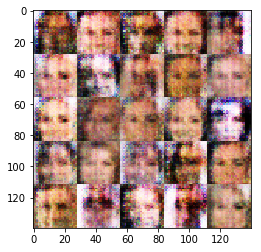

Epoch 1/5... Discriminator Loss: 1.2516... Generator Loss: 0.8396
Epoch 1/5... Discriminator Loss: 1.3303... Generator Loss: 0.7872
Epoch 1/5... Discriminator Loss: 1.2998... Generator Loss: 0.7839
Epoch 1/5... Discriminator Loss: 1.3778... Generator Loss: 0.7755
Epoch 1/5... Discriminator Loss: 1.3489... Generator Loss: 0.7481
Epoch 1/5... Discriminator Loss: 1.4086... Generator Loss: 0.7566
Epoch 1/5... Discriminator Loss: 1.3927... Generator Loss: 0.7330
Epoch 1/5... Discriminator Loss: 1.2807... Generator Loss: 0.7903
Epoch 1/5... Discriminator Loss: 1.4295... Generator Loss: 0.7300
Epoch 1/5... Discriminator Loss: 1.3224... Generator Loss: 0.8211


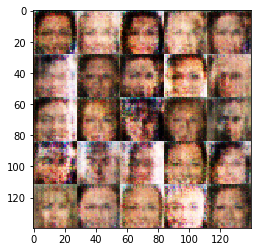

Epoch 1/5... Discriminator Loss: 1.3456... Generator Loss: 0.7481
Epoch 1/5... Discriminator Loss: 1.3080... Generator Loss: 0.8947
Epoch 1/5... Discriminator Loss: 1.3917... Generator Loss: 0.7362
Epoch 1/5... Discriminator Loss: 1.3570... Generator Loss: 0.7576
Epoch 1/5... Discriminator Loss: 1.4514... Generator Loss: 0.7433
Epoch 1/5... Discriminator Loss: 1.3545... Generator Loss: 0.7371
Epoch 1/5... Discriminator Loss: 1.3957... Generator Loss: 0.6700
Epoch 1/5... Discriminator Loss: 1.4392... Generator Loss: 0.7461
Epoch 1/5... Discriminator Loss: 1.4383... Generator Loss: 0.7830
Epoch 1/5... Discriminator Loss: 1.2097... Generator Loss: 0.7677


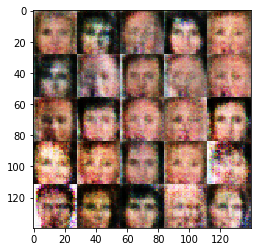

Epoch 1/5... Discriminator Loss: 1.3659... Generator Loss: 0.7296
Epoch 1/5... Discriminator Loss: 1.3648... Generator Loss: 0.8073
Epoch 1/5... Discriminator Loss: 1.3487... Generator Loss: 0.7801
Epoch 1/5... Discriminator Loss: 1.3847... Generator Loss: 0.8827
Epoch 1/5... Discriminator Loss: 1.2971... Generator Loss: 0.7954
Epoch 1/5... Discriminator Loss: 1.3122... Generator Loss: 0.8701
Epoch 1/5... Discriminator Loss: 1.3154... Generator Loss: 0.7647
Epoch 1/5... Discriminator Loss: 1.3098... Generator Loss: 0.8019
Epoch 1/5... Discriminator Loss: 1.2154... Generator Loss: 0.8180
Epoch 1/5... Discriminator Loss: 1.3841... Generator Loss: 0.8160


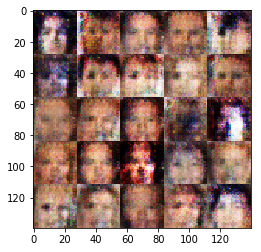

Epoch 1/5... Discriminator Loss: 1.4150... Generator Loss: 0.7925
Epoch 1/5... Discriminator Loss: 1.3893... Generator Loss: 0.7965
Epoch 1/5... Discriminator Loss: 1.2933... Generator Loss: 0.8189
Epoch 1/5... Discriminator Loss: 1.3097... Generator Loss: 0.8435
Epoch 1/5... Discriminator Loss: 1.4023... Generator Loss: 0.7893
Epoch 1/5... Discriminator Loss: 1.2848... Generator Loss: 0.8504
Epoch 1/5... Discriminator Loss: 1.3473... Generator Loss: 0.8591
Epoch 1/5... Discriminator Loss: 1.3136... Generator Loss: 0.8030
Epoch 1/5... Discriminator Loss: 1.2681... Generator Loss: 0.7704
Epoch 1/5... Discriminator Loss: 1.3195... Generator Loss: 0.7529


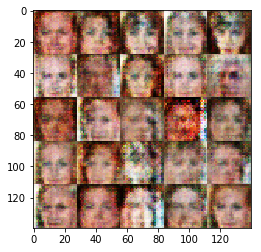

Epoch 1/5... Discriminator Loss: 1.4177... Generator Loss: 0.7756
Epoch 1/5... Discriminator Loss: 1.2960... Generator Loss: 0.8165
Epoch 1/5... Discriminator Loss: 1.2608... Generator Loss: 0.8789
Epoch 1/5... Discriminator Loss: 1.4536... Generator Loss: 0.6692
Epoch 1/5... Discriminator Loss: 1.4797... Generator Loss: 0.8411
Epoch 1/5... Discriminator Loss: 1.3068... Generator Loss: 0.8417
Epoch 1/5... Discriminator Loss: 1.3086... Generator Loss: 0.8493
Epoch 1/5... Discriminator Loss: 1.3975... Generator Loss: 0.8659
Epoch 1/5... Discriminator Loss: 1.2444... Generator Loss: 0.8261
Epoch 1/5... Discriminator Loss: 1.3953... Generator Loss: 1.1022


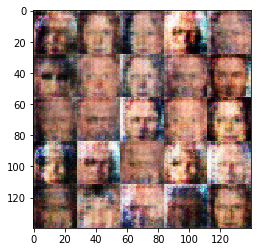

Epoch 1/5... Discriminator Loss: 1.3853... Generator Loss: 0.8264
Epoch 1/5... Discriminator Loss: 1.3694... Generator Loss: 0.9940
Epoch 1/5... Discriminator Loss: 1.4295... Generator Loss: 0.8095
Epoch 1/5... Discriminator Loss: 1.3227... Generator Loss: 0.7896
Epoch 1/5... Discriminator Loss: 1.2631... Generator Loss: 1.0045
Epoch 1/5... Discriminator Loss: 1.3981... Generator Loss: 0.7288
Epoch 1/5... Discriminator Loss: 1.2895... Generator Loss: 0.7755
Epoch 1/5... Discriminator Loss: 1.2654... Generator Loss: 0.8390
Epoch 1/5... Discriminator Loss: 1.2963... Generator Loss: 0.8578
Epoch 1/5... Discriminator Loss: 1.4029... Generator Loss: 0.7940


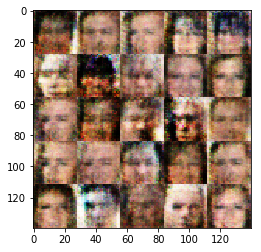

Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.7971
Epoch 1/5... Discriminator Loss: 1.3370... Generator Loss: 0.8422
Epoch 1/5... Discriminator Loss: 1.3963... Generator Loss: 0.7550
Epoch 1/5... Discriminator Loss: 1.2290... Generator Loss: 0.8450
Epoch 1/5... Discriminator Loss: 1.3956... Generator Loss: 0.8258
Epoch 1/5... Discriminator Loss: 1.3046... Generator Loss: 0.8529
Epoch 1/5... Discriminator Loss: 1.3368... Generator Loss: 0.7946
Epoch 1/5... Discriminator Loss: 1.3268... Generator Loss: 0.8882
Epoch 1/5... Discriminator Loss: 1.3595... Generator Loss: 0.9325
Epoch 1/5... Discriminator Loss: 1.1989... Generator Loss: 0.9920


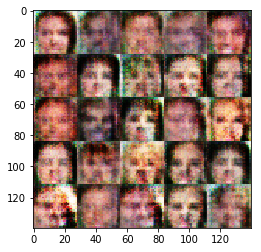

Epoch 1/5... Discriminator Loss: 1.4380... Generator Loss: 0.8607
Epoch 1/5... Discriminator Loss: 1.3775... Generator Loss: 1.0789
Epoch 1/5... Discriminator Loss: 1.3980... Generator Loss: 0.8721
Epoch 1/5... Discriminator Loss: 1.4894... Generator Loss: 0.7662
Epoch 1/5... Discriminator Loss: 1.3095... Generator Loss: 0.9493
Epoch 1/5... Discriminator Loss: 1.3751... Generator Loss: 0.7080
Epoch 1/5... Discriminator Loss: 1.2513... Generator Loss: 0.8624
Epoch 1/5... Discriminator Loss: 1.3479... Generator Loss: 0.9006
Epoch 1/5... Discriminator Loss: 1.2457... Generator Loss: 0.8420
Epoch 1/5... Discriminator Loss: 1.2581... Generator Loss: 0.9822


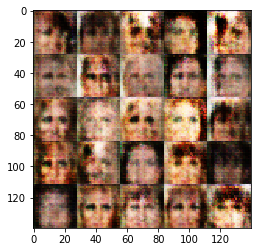

Epoch 1/5... Discriminator Loss: 1.3133... Generator Loss: 0.7923
Epoch 1/5... Discriminator Loss: 1.4130... Generator Loss: 0.9228
Epoch 1/5... Discriminator Loss: 1.2993... Generator Loss: 0.8100
Epoch 1/5... Discriminator Loss: 1.3396... Generator Loss: 0.8670
Epoch 1/5... Discriminator Loss: 1.3910... Generator Loss: 0.8701
Epoch 1/5... Discriminator Loss: 1.2749... Generator Loss: 0.7880
Epoch 1/5... Discriminator Loss: 1.3230... Generator Loss: 0.7412
Epoch 1/5... Discriminator Loss: 1.2893... Generator Loss: 0.7810
Epoch 1/5... Discriminator Loss: 1.1686... Generator Loss: 0.8093
Epoch 1/5... Discriminator Loss: 1.4773... Generator Loss: 0.8399


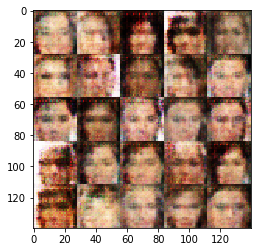

Epoch 1/5... Discriminator Loss: 1.2561... Generator Loss: 0.8729
Epoch 1/5... Discriminator Loss: 1.2899... Generator Loss: 0.7660
Epoch 1/5... Discriminator Loss: 1.2632... Generator Loss: 0.9757
Epoch 1/5... Discriminator Loss: 1.2794... Generator Loss: 0.8528
Epoch 1/5... Discriminator Loss: 1.3642... Generator Loss: 0.8357
Epoch 1/5... Discriminator Loss: 1.2934... Generator Loss: 0.8649
Epoch 1/5... Discriminator Loss: 1.2427... Generator Loss: 0.9093
Epoch 1/5... Discriminator Loss: 1.3039... Generator Loss: 0.8507
Epoch 1/5... Discriminator Loss: 1.3662... Generator Loss: 0.9005
Epoch 1/5... Discriminator Loss: 1.2985... Generator Loss: 0.8147


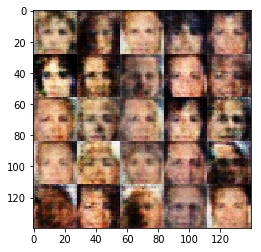

Epoch 1/5... Discriminator Loss: 1.3642... Generator Loss: 0.9447
Epoch 1/5... Discriminator Loss: 1.3489... Generator Loss: 0.8423
Epoch 1/5... Discriminator Loss: 1.1676... Generator Loss: 0.9433
Epoch 1/5... Discriminator Loss: 1.3504... Generator Loss: 0.9962
Epoch 1/5... Discriminator Loss: 1.2907... Generator Loss: 0.8471
Epoch 1/5... Discriminator Loss: 1.3587... Generator Loss: 0.7588
Epoch 1/5... Discriminator Loss: 1.2666... Generator Loss: 0.8585
Epoch 1/5... Discriminator Loss: 1.2014... Generator Loss: 0.8480
Epoch 1/5... Discriminator Loss: 1.4781... Generator Loss: 0.6949
Epoch 1/5... Discriminator Loss: 1.2622... Generator Loss: 0.8577


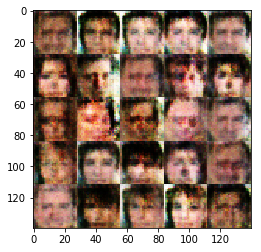

Epoch 1/5... Discriminator Loss: 1.2225... Generator Loss: 0.9169
Epoch 1/5... Discriminator Loss: 1.2075... Generator Loss: 0.9282
Epoch 1/5... Discriminator Loss: 1.2841... Generator Loss: 0.8444
Epoch 1/5... Discriminator Loss: 1.3124... Generator Loss: 0.7791
Epoch 1/5... Discriminator Loss: 1.1039... Generator Loss: 1.0741
Epoch 1/5... Discriminator Loss: 1.2744... Generator Loss: 0.7652
Epoch 1/5... Discriminator Loss: 1.3517... Generator Loss: 0.8465
Epoch 1/5... Discriminator Loss: 1.3792... Generator Loss: 0.7935
Epoch 1/5... Discriminator Loss: 1.3945... Generator Loss: 0.7754
Epoch 1/5... Discriminator Loss: 1.3494... Generator Loss: 0.8143


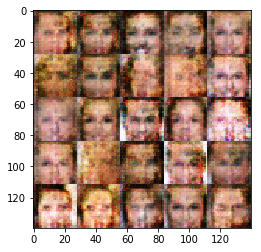

Epoch 1/5... Discriminator Loss: 1.3381... Generator Loss: 0.7132
Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.9243
Epoch 1/5... Discriminator Loss: 1.2309... Generator Loss: 0.8139
Epoch 2/5... Discriminator Loss: 1.2579... Generator Loss: 1.0015
Epoch 2/5... Discriminator Loss: 1.3138... Generator Loss: 0.8799
Epoch 2/5... Discriminator Loss: 1.2931... Generator Loss: 0.7832
Epoch 2/5... Discriminator Loss: 1.4138... Generator Loss: 1.0391
Epoch 2/5... Discriminator Loss: 1.2861... Generator Loss: 0.8727
Epoch 2/5... Discriminator Loss: 1.3432... Generator Loss: 0.7646
Epoch 2/5... Discriminator Loss: 1.5707... Generator Loss: 0.6498


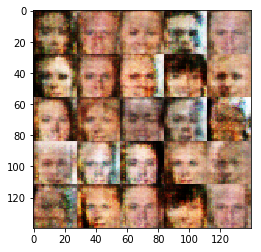

Epoch 2/5... Discriminator Loss: 1.3424... Generator Loss: 0.8394
Epoch 2/5... Discriminator Loss: 1.3121... Generator Loss: 0.8036
Epoch 2/5... Discriminator Loss: 1.3064... Generator Loss: 0.7482
Epoch 2/5... Discriminator Loss: 1.3788... Generator Loss: 0.8453
Epoch 2/5... Discriminator Loss: 1.2297... Generator Loss: 0.8351
Epoch 2/5... Discriminator Loss: 1.2523... Generator Loss: 0.8480
Epoch 2/5... Discriminator Loss: 1.3076... Generator Loss: 0.9079
Epoch 2/5... Discriminator Loss: 1.3575... Generator Loss: 0.8567
Epoch 2/5... Discriminator Loss: 1.2826... Generator Loss: 0.8367
Epoch 2/5... Discriminator Loss: 1.3254... Generator Loss: 0.8610


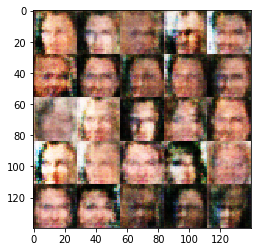

Epoch 2/5... Discriminator Loss: 1.3789... Generator Loss: 1.0364
Epoch 2/5... Discriminator Loss: 1.2621... Generator Loss: 0.8929
Epoch 2/5... Discriminator Loss: 1.3308... Generator Loss: 0.9856
Epoch 2/5... Discriminator Loss: 1.2901... Generator Loss: 0.8471
Epoch 2/5... Discriminator Loss: 1.2569... Generator Loss: 1.0370
Epoch 2/5... Discriminator Loss: 1.5070... Generator Loss: 0.8413
Epoch 2/5... Discriminator Loss: 1.4152... Generator Loss: 0.6327
Epoch 2/5... Discriminator Loss: 1.3456... Generator Loss: 0.8665
Epoch 2/5... Discriminator Loss: 1.3571... Generator Loss: 0.8352
Epoch 2/5... Discriminator Loss: 1.3908... Generator Loss: 0.7427


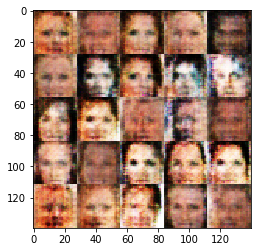

Epoch 2/5... Discriminator Loss: 1.2170... Generator Loss: 0.9236
Epoch 2/5... Discriminator Loss: 1.1876... Generator Loss: 0.8709
Epoch 2/5... Discriminator Loss: 1.4598... Generator Loss: 0.7948
Epoch 2/5... Discriminator Loss: 1.3215... Generator Loss: 0.7593
Epoch 2/5... Discriminator Loss: 1.3716... Generator Loss: 0.8526
Epoch 2/5... Discriminator Loss: 1.3382... Generator Loss: 0.9893
Epoch 2/5... Discriminator Loss: 1.2499... Generator Loss: 0.9394
Epoch 2/5... Discriminator Loss: 1.3832... Generator Loss: 0.8559
Epoch 2/5... Discriminator Loss: 1.2371... Generator Loss: 0.9111
Epoch 2/5... Discriminator Loss: 1.3260... Generator Loss: 0.9085


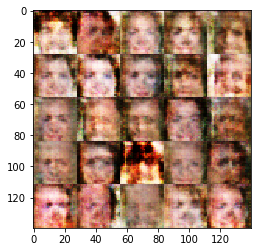

Epoch 2/5... Discriminator Loss: 1.3393... Generator Loss: 0.8206
Epoch 2/5... Discriminator Loss: 1.1109... Generator Loss: 0.9465
Epoch 2/5... Discriminator Loss: 1.3911... Generator Loss: 1.0407
Epoch 2/5... Discriminator Loss: 1.2617... Generator Loss: 1.0173
Epoch 2/5... Discriminator Loss: 1.3469... Generator Loss: 0.8472
Epoch 2/5... Discriminator Loss: 1.2874... Generator Loss: 0.8838
Epoch 2/5... Discriminator Loss: 1.3119... Generator Loss: 0.9113
Epoch 2/5... Discriminator Loss: 1.4638... Generator Loss: 0.8320
Epoch 2/5... Discriminator Loss: 1.2598... Generator Loss: 0.8777
Epoch 2/5... Discriminator Loss: 1.1914... Generator Loss: 0.9760


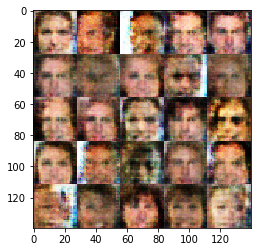

Epoch 2/5... Discriminator Loss: 1.5002... Generator Loss: 1.0185
Epoch 2/5... Discriminator Loss: 1.1591... Generator Loss: 0.8576
Epoch 2/5... Discriminator Loss: 1.3968... Generator Loss: 0.9397
Epoch 2/5... Discriminator Loss: 1.3801... Generator Loss: 1.3275
Epoch 2/5... Discriminator Loss: 1.4191... Generator Loss: 0.8767
Epoch 2/5... Discriminator Loss: 1.2283... Generator Loss: 1.1706
Epoch 2/5... Discriminator Loss: 1.2309... Generator Loss: 1.0388
Epoch 2/5... Discriminator Loss: 1.4649... Generator Loss: 0.9370
Epoch 2/5... Discriminator Loss: 1.2611... Generator Loss: 0.9177
Epoch 2/5... Discriminator Loss: 1.4597... Generator Loss: 1.1054


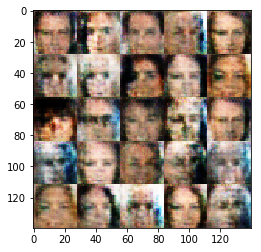

Epoch 2/5... Discriminator Loss: 1.2968... Generator Loss: 0.9032
Epoch 2/5... Discriminator Loss: 1.2780... Generator Loss: 0.9755
Epoch 2/5... Discriminator Loss: 1.3535... Generator Loss: 0.9027
Epoch 2/5... Discriminator Loss: 1.1825... Generator Loss: 0.9515
Epoch 2/5... Discriminator Loss: 1.3047... Generator Loss: 1.0188
Epoch 2/5... Discriminator Loss: 1.2722... Generator Loss: 1.2027
Epoch 2/5... Discriminator Loss: 1.2347... Generator Loss: 1.2480
Epoch 2/5... Discriminator Loss: 1.2863... Generator Loss: 1.0918
Epoch 2/5... Discriminator Loss: 1.2899... Generator Loss: 1.1197
Epoch 2/5... Discriminator Loss: 1.3090... Generator Loss: 0.9566


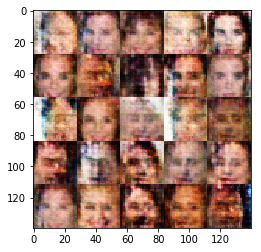

Epoch 2/5... Discriminator Loss: 1.2786... Generator Loss: 1.0759
Epoch 2/5... Discriminator Loss: 1.2405... Generator Loss: 0.9446
Epoch 2/5... Discriminator Loss: 1.6594... Generator Loss: 0.8450
Epoch 2/5... Discriminator Loss: 1.2647... Generator Loss: 1.0325
Epoch 2/5... Discriminator Loss: 1.1402... Generator Loss: 0.9985
Epoch 2/5... Discriminator Loss: 1.3197... Generator Loss: 0.9391
Epoch 2/5... Discriminator Loss: 1.3232... Generator Loss: 0.8916
Epoch 2/5... Discriminator Loss: 1.4065... Generator Loss: 0.8503
Epoch 2/5... Discriminator Loss: 1.2666... Generator Loss: 1.0759
Epoch 2/5... Discriminator Loss: 1.3935... Generator Loss: 0.9197


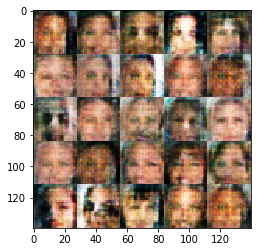

Epoch 2/5... Discriminator Loss: 1.4054... Generator Loss: 0.8987
Epoch 2/5... Discriminator Loss: 1.2377... Generator Loss: 0.9518
Epoch 2/5... Discriminator Loss: 1.1571... Generator Loss: 1.0912
Epoch 2/5... Discriminator Loss: 1.2032... Generator Loss: 0.9445
Epoch 2/5... Discriminator Loss: 1.1579... Generator Loss: 1.0687
Epoch 2/5... Discriminator Loss: 1.3256... Generator Loss: 0.8513
Epoch 2/5... Discriminator Loss: 1.1786... Generator Loss: 1.1239
Epoch 2/5... Discriminator Loss: 1.4305... Generator Loss: 0.8238
Epoch 2/5... Discriminator Loss: 1.1184... Generator Loss: 0.8520
Epoch 2/5... Discriminator Loss: 1.3311... Generator Loss: 0.9336


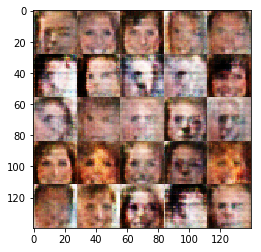

Epoch 2/5... Discriminator Loss: 1.2750... Generator Loss: 0.9372
Epoch 2/5... Discriminator Loss: 1.1929... Generator Loss: 1.4365
Epoch 2/5... Discriminator Loss: 1.3836... Generator Loss: 0.7619
Epoch 2/5... Discriminator Loss: 1.1202... Generator Loss: 0.9175
Epoch 2/5... Discriminator Loss: 1.3693... Generator Loss: 1.5416
Epoch 2/5... Discriminator Loss: 1.3174... Generator Loss: 0.9505
Epoch 2/5... Discriminator Loss: 1.3552... Generator Loss: 1.1207
Epoch 2/5... Discriminator Loss: 1.4597... Generator Loss: 0.9614
Epoch 2/5... Discriminator Loss: 1.3606... Generator Loss: 0.9415
Epoch 2/5... Discriminator Loss: 1.3183... Generator Loss: 1.1631


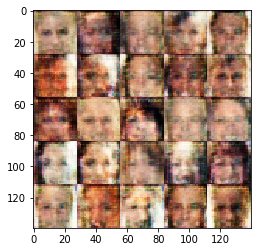

Epoch 2/5... Discriminator Loss: 1.2199... Generator Loss: 0.8933
Epoch 2/5... Discriminator Loss: 1.3446... Generator Loss: 1.0750
Epoch 2/5... Discriminator Loss: 1.1058... Generator Loss: 0.9204
Epoch 2/5... Discriminator Loss: 1.4214... Generator Loss: 0.9787
Epoch 2/5... Discriminator Loss: 1.4965... Generator Loss: 1.6022
Epoch 2/5... Discriminator Loss: 1.1181... Generator Loss: 1.2389
Epoch 2/5... Discriminator Loss: 1.2030... Generator Loss: 1.0342
Epoch 2/5... Discriminator Loss: 1.2173... Generator Loss: 1.3037
Epoch 2/5... Discriminator Loss: 1.1811... Generator Loss: 0.9770
Epoch 2/5... Discriminator Loss: 1.0078... Generator Loss: 1.4306


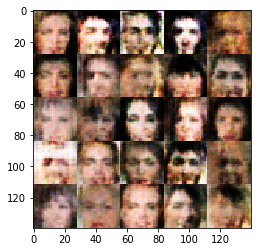

Epoch 2/5... Discriminator Loss: 1.2911... Generator Loss: 0.8362
Epoch 2/5... Discriminator Loss: 1.2158... Generator Loss: 1.4016
Epoch 2/5... Discriminator Loss: 1.2834... Generator Loss: 1.0382
Epoch 2/5... Discriminator Loss: 1.3835... Generator Loss: 0.9681
Epoch 2/5... Discriminator Loss: 1.4936... Generator Loss: 0.7559
Epoch 2/5... Discriminator Loss: 1.2252... Generator Loss: 0.8480
Epoch 2/5... Discriminator Loss: 1.0782... Generator Loss: 1.0848
Epoch 2/5... Discriminator Loss: 1.6643... Generator Loss: 0.9167
Epoch 2/5... Discriminator Loss: 1.0960... Generator Loss: 1.0404
Epoch 2/5... Discriminator Loss: 1.0875... Generator Loss: 1.1863


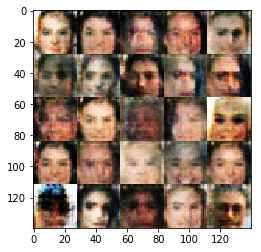

Epoch 2/5... Discriminator Loss: 1.3854... Generator Loss: 0.8178
Epoch 2/5... Discriminator Loss: 1.3229... Generator Loss: 0.8287
Epoch 2/5... Discriminator Loss: 1.2018... Generator Loss: 1.1534
Epoch 2/5... Discriminator Loss: 1.5568... Generator Loss: 0.9174
Epoch 2/5... Discriminator Loss: 1.2118... Generator Loss: 0.9689
Epoch 2/5... Discriminator Loss: 0.9583... Generator Loss: 1.0321
Epoch 2/5... Discriminator Loss: 1.2233... Generator Loss: 0.9854
Epoch 2/5... Discriminator Loss: 1.1358... Generator Loss: 1.0521
Epoch 2/5... Discriminator Loss: 1.5439... Generator Loss: 0.9152
Epoch 2/5... Discriminator Loss: 0.9471... Generator Loss: 1.1398


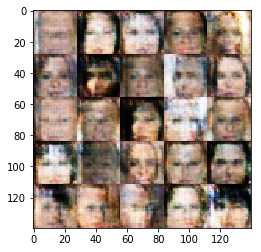

Epoch 2/5... Discriminator Loss: 1.1345... Generator Loss: 0.9152
Epoch 2/5... Discriminator Loss: 1.1295... Generator Loss: 1.1619
Epoch 2/5... Discriminator Loss: 1.2142... Generator Loss: 0.8215
Epoch 2/5... Discriminator Loss: 1.2019... Generator Loss: 1.1715
Epoch 2/5... Discriminator Loss: 1.5141... Generator Loss: 1.2510
Epoch 2/5... Discriminator Loss: 1.2877... Generator Loss: 1.0821
Epoch 2/5... Discriminator Loss: 1.2616... Generator Loss: 1.0719
Epoch 2/5... Discriminator Loss: 1.1045... Generator Loss: 0.8621
Epoch 2/5... Discriminator Loss: 1.3465... Generator Loss: 0.8758
Epoch 2/5... Discriminator Loss: 1.1814... Generator Loss: 1.0707


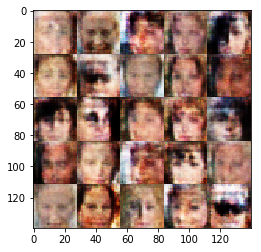

Epoch 2/5... Discriminator Loss: 1.3901... Generator Loss: 1.0252
Epoch 2/5... Discriminator Loss: 1.0423... Generator Loss: 1.3070
Epoch 2/5... Discriminator Loss: 1.4473... Generator Loss: 1.0679
Epoch 2/5... Discriminator Loss: 1.2522... Generator Loss: 0.8727
Epoch 2/5... Discriminator Loss: 1.1047... Generator Loss: 1.1147
Epoch 2/5... Discriminator Loss: 1.3273... Generator Loss: 1.1590
Epoch 2/5... Discriminator Loss: 1.1458... Generator Loss: 0.8975
Epoch 2/5... Discriminator Loss: 1.1992... Generator Loss: 0.9868
Epoch 2/5... Discriminator Loss: 1.5014... Generator Loss: 0.9598
Epoch 2/5... Discriminator Loss: 1.1867... Generator Loss: 0.8756


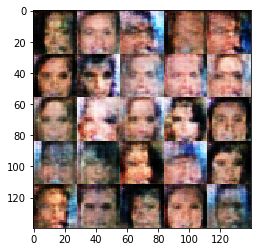

Epoch 2/5... Discriminator Loss: 1.4797... Generator Loss: 0.8703
Epoch 2/5... Discriminator Loss: 1.1365... Generator Loss: 1.1577
Epoch 2/5... Discriminator Loss: 1.1286... Generator Loss: 1.1112
Epoch 2/5... Discriminator Loss: 1.1482... Generator Loss: 0.8655
Epoch 2/5... Discriminator Loss: 1.2435... Generator Loss: 1.1375
Epoch 2/5... Discriminator Loss: 1.2034... Generator Loss: 1.0170
Epoch 2/5... Discriminator Loss: 1.0049... Generator Loss: 1.0501
Epoch 2/5... Discriminator Loss: 1.2661... Generator Loss: 1.0444
Epoch 2/5... Discriminator Loss: 1.2867... Generator Loss: 0.8271
Epoch 2/5... Discriminator Loss: 1.2365... Generator Loss: 1.2902


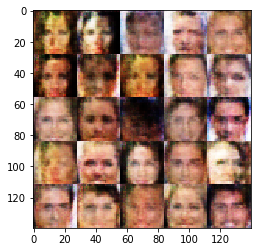

Epoch 2/5... Discriminator Loss: 1.1232... Generator Loss: 1.2255
Epoch 2/5... Discriminator Loss: 0.9832... Generator Loss: 0.9646
Epoch 2/5... Discriminator Loss: 1.5663... Generator Loss: 1.2178
Epoch 2/5... Discriminator Loss: 1.2599... Generator Loss: 0.9159
Epoch 2/5... Discriminator Loss: 1.3208... Generator Loss: 1.0803
Epoch 2/5... Discriminator Loss: 1.1428... Generator Loss: 0.8606
Epoch 2/5... Discriminator Loss: 1.1783... Generator Loss: 1.3050
Epoch 2/5... Discriminator Loss: 1.4081... Generator Loss: 1.2024
Epoch 2/5... Discriminator Loss: 1.0729... Generator Loss: 1.2594
Epoch 2/5... Discriminator Loss: 1.3162... Generator Loss: 0.7433


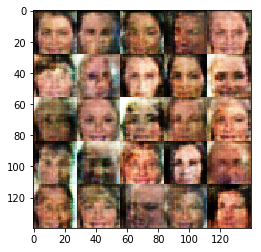

Epoch 2/5... Discriminator Loss: 0.9305... Generator Loss: 1.1065
Epoch 2/5... Discriminator Loss: 1.2948... Generator Loss: 1.1679
Epoch 2/5... Discriminator Loss: 1.4104... Generator Loss: 1.1606
Epoch 2/5... Discriminator Loss: 1.1082... Generator Loss: 0.9146
Epoch 2/5... Discriminator Loss: 1.2409... Generator Loss: 1.1639
Epoch 2/5... Discriminator Loss: 1.3686... Generator Loss: 0.9566
Epoch 2/5... Discriminator Loss: 1.2685... Generator Loss: 0.9486
Epoch 2/5... Discriminator Loss: 1.2208... Generator Loss: 1.3398
Epoch 2/5... Discriminator Loss: 1.2049... Generator Loss: 1.1850
Epoch 2/5... Discriminator Loss: 1.1317... Generator Loss: 1.4744


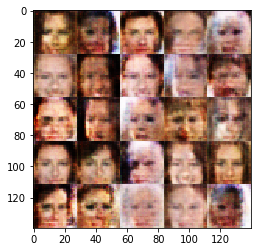

Epoch 2/5... Discriminator Loss: 1.1851... Generator Loss: 1.3298
Epoch 2/5... Discriminator Loss: 1.2527... Generator Loss: 1.2655
Epoch 2/5... Discriminator Loss: 1.3054... Generator Loss: 1.0139
Epoch 2/5... Discriminator Loss: 1.3212... Generator Loss: 1.2220
Epoch 2/5... Discriminator Loss: 1.2700... Generator Loss: 0.9836
Epoch 2/5... Discriminator Loss: 0.9823... Generator Loss: 1.0379
Epoch 2/5... Discriminator Loss: 1.2082... Generator Loss: 1.1354
Epoch 2/5... Discriminator Loss: 1.0437... Generator Loss: 1.2416
Epoch 2/5... Discriminator Loss: 0.8486... Generator Loss: 1.4686
Epoch 2/5... Discriminator Loss: 1.1447... Generator Loss: 1.1111


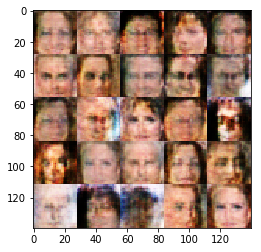

Epoch 2/5... Discriminator Loss: 1.4475... Generator Loss: 1.1735
Epoch 2/5... Discriminator Loss: 1.1123... Generator Loss: 1.3411
Epoch 2/5... Discriminator Loss: 1.2329... Generator Loss: 0.8430
Epoch 2/5... Discriminator Loss: 1.2356... Generator Loss: 0.9618
Epoch 2/5... Discriminator Loss: 1.0252... Generator Loss: 1.2834
Epoch 2/5... Discriminator Loss: 1.3221... Generator Loss: 0.9679
Epoch 2/5... Discriminator Loss: 1.2810... Generator Loss: 0.8659
Epoch 2/5... Discriminator Loss: 1.3668... Generator Loss: 1.0623
Epoch 2/5... Discriminator Loss: 1.2115... Generator Loss: 1.1092
Epoch 2/5... Discriminator Loss: 0.9860... Generator Loss: 1.1877


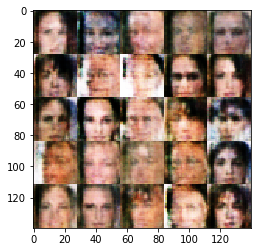

Epoch 2/5... Discriminator Loss: 1.2930... Generator Loss: 1.0046
Epoch 2/5... Discriminator Loss: 1.2880... Generator Loss: 1.0420
Epoch 2/5... Discriminator Loss: 1.0108... Generator Loss: 1.4655
Epoch 2/5... Discriminator Loss: 1.0834... Generator Loss: 1.3151
Epoch 2/5... Discriminator Loss: 1.2073... Generator Loss: 1.0903
Epoch 2/5... Discriminator Loss: 1.2632... Generator Loss: 0.8447
Epoch 2/5... Discriminator Loss: 1.1464... Generator Loss: 1.2586
Epoch 2/5... Discriminator Loss: 1.2793... Generator Loss: 1.0250
Epoch 2/5... Discriminator Loss: 1.2601... Generator Loss: 1.4076
Epoch 2/5... Discriminator Loss: 1.2697... Generator Loss: 1.0088


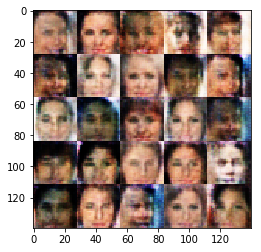

Epoch 2/5... Discriminator Loss: 1.3157... Generator Loss: 1.0229
Epoch 2/5... Discriminator Loss: 1.3010... Generator Loss: 1.1162
Epoch 2/5... Discriminator Loss: 1.1791... Generator Loss: 0.8702
Epoch 2/5... Discriminator Loss: 1.3613... Generator Loss: 0.9450
Epoch 2/5... Discriminator Loss: 1.2704... Generator Loss: 0.9395
Epoch 2/5... Discriminator Loss: 1.1030... Generator Loss: 1.2232
Epoch 2/5... Discriminator Loss: 0.8988... Generator Loss: 1.3131
Epoch 2/5... Discriminator Loss: 1.2108... Generator Loss: 0.9290
Epoch 2/5... Discriminator Loss: 1.0043... Generator Loss: 1.2240
Epoch 2/5... Discriminator Loss: 0.9211... Generator Loss: 1.2480


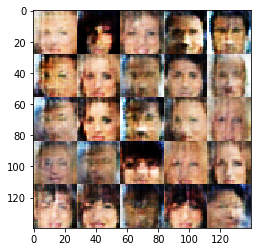

Epoch 2/5... Discriminator Loss: 1.2506... Generator Loss: 1.0854
Epoch 2/5... Discriminator Loss: 0.9192... Generator Loss: 1.5384
Epoch 2/5... Discriminator Loss: 1.1486... Generator Loss: 0.9028
Epoch 2/5... Discriminator Loss: 1.0424... Generator Loss: 1.3897
Epoch 2/5... Discriminator Loss: 0.9314... Generator Loss: 1.2097
Epoch 2/5... Discriminator Loss: 1.1843... Generator Loss: 1.3014
Epoch 2/5... Discriminator Loss: 0.9445... Generator Loss: 1.2695
Epoch 2/5... Discriminator Loss: 1.1821... Generator Loss: 1.4186
Epoch 2/5... Discriminator Loss: 1.2364... Generator Loss: 1.5656
Epoch 2/5... Discriminator Loss: 1.2572... Generator Loss: 1.1839


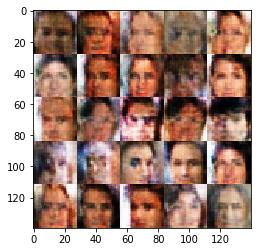

Epoch 2/5... Discriminator Loss: 1.0012... Generator Loss: 1.2466
Epoch 2/5... Discriminator Loss: 1.1630... Generator Loss: 1.0753
Epoch 2/5... Discriminator Loss: 1.3587... Generator Loss: 1.1717
Epoch 2/5... Discriminator Loss: 1.1463... Generator Loss: 1.2905
Epoch 2/5... Discriminator Loss: 1.3003... Generator Loss: 0.8214
Epoch 2/5... Discriminator Loss: 1.0031... Generator Loss: 1.5903
Epoch 2/5... Discriminator Loss: 1.2000... Generator Loss: 1.2486
Epoch 2/5... Discriminator Loss: 1.3101... Generator Loss: 1.0025
Epoch 2/5... Discriminator Loss: 1.1173... Generator Loss: 0.8486
Epoch 2/5... Discriminator Loss: 1.2592... Generator Loss: 1.2812


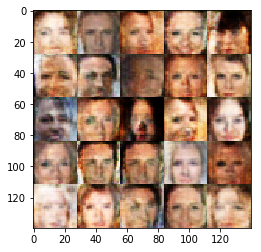

Epoch 2/5... Discriminator Loss: 1.1096... Generator Loss: 1.0705
Epoch 2/5... Discriminator Loss: 1.3540... Generator Loss: 0.9612
Epoch 2/5... Discriminator Loss: 0.9629... Generator Loss: 1.2218
Epoch 2/5... Discriminator Loss: 0.9724... Generator Loss: 1.1674
Epoch 2/5... Discriminator Loss: 0.9812... Generator Loss: 1.2582
Epoch 2/5... Discriminator Loss: 0.8809... Generator Loss: 1.3361
Epoch 2/5... Discriminator Loss: 1.2725... Generator Loss: 1.2923
Epoch 2/5... Discriminator Loss: 1.3423... Generator Loss: 1.1941
Epoch 2/5... Discriminator Loss: 1.3092... Generator Loss: 0.8228
Epoch 2/5... Discriminator Loss: 0.7440... Generator Loss: 1.0936


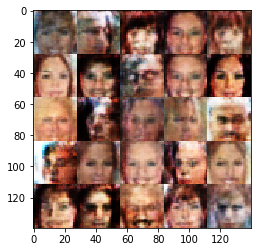

Epoch 2/5... Discriminator Loss: 1.0265... Generator Loss: 1.4155
Epoch 2/5... Discriminator Loss: 0.8910... Generator Loss: 1.2974
Epoch 2/5... Discriminator Loss: 1.1192... Generator Loss: 1.5088
Epoch 2/5... Discriminator Loss: 0.9011... Generator Loss: 1.3742
Epoch 2/5... Discriminator Loss: 1.2446... Generator Loss: 1.4340
Epoch 2/5... Discriminator Loss: 0.8947... Generator Loss: 1.2771
Epoch 3/5... Discriminator Loss: 0.9756... Generator Loss: 1.4338
Epoch 3/5... Discriminator Loss: 0.7854... Generator Loss: 1.4732
Epoch 3/5... Discriminator Loss: 0.9859... Generator Loss: 1.5691
Epoch 3/5... Discriminator Loss: 1.4157... Generator Loss: 1.0728


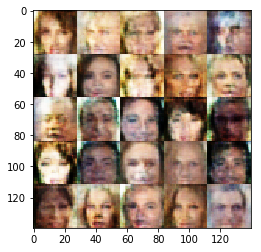

Epoch 3/5... Discriminator Loss: 1.0224... Generator Loss: 1.2049
Epoch 3/5... Discriminator Loss: 1.4440... Generator Loss: 1.2629
Epoch 3/5... Discriminator Loss: 1.6610... Generator Loss: 1.5096
Epoch 3/5... Discriminator Loss: 1.2180... Generator Loss: 1.3610
Epoch 3/5... Discriminator Loss: 0.9347... Generator Loss: 1.2010
Epoch 3/5... Discriminator Loss: 1.1476... Generator Loss: 1.0934
Epoch 3/5... Discriminator Loss: 1.0387... Generator Loss: 1.3833
Epoch 3/5... Discriminator Loss: 0.9999... Generator Loss: 1.2479
Epoch 3/5... Discriminator Loss: 0.9847... Generator Loss: 1.4387
Epoch 3/5... Discriminator Loss: 1.1755... Generator Loss: 1.3516


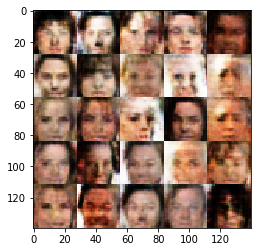

Epoch 3/5... Discriminator Loss: 1.2800... Generator Loss: 1.2346
Epoch 3/5... Discriminator Loss: 0.9676... Generator Loss: 1.3090
Epoch 3/5... Discriminator Loss: 1.3246... Generator Loss: 1.3317
Epoch 3/5... Discriminator Loss: 0.9599... Generator Loss: 1.5680
Epoch 3/5... Discriminator Loss: 1.5337... Generator Loss: 1.2297
Epoch 3/5... Discriminator Loss: 1.0077... Generator Loss: 1.6125
Epoch 3/5... Discriminator Loss: 1.2882... Generator Loss: 1.3616
Epoch 3/5... Discriminator Loss: 1.1014... Generator Loss: 1.2030
Epoch 3/5... Discriminator Loss: 0.7483... Generator Loss: 1.6889
Epoch 3/5... Discriminator Loss: 1.1279... Generator Loss: 1.3236


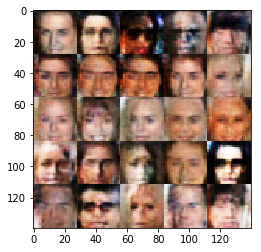

Epoch 3/5... Discriminator Loss: 0.9578... Generator Loss: 1.3665
Epoch 3/5... Discriminator Loss: 1.1155... Generator Loss: 1.4177
Epoch 3/5... Discriminator Loss: 1.2879... Generator Loss: 1.1599
Epoch 3/5... Discriminator Loss: 0.9654... Generator Loss: 1.1970
Epoch 3/5... Discriminator Loss: 1.2649... Generator Loss: 1.2669
Epoch 3/5... Discriminator Loss: 1.0955... Generator Loss: 1.4485
Epoch 3/5... Discriminator Loss: 1.1022... Generator Loss: 1.3778
Epoch 3/5... Discriminator Loss: 0.9056... Generator Loss: 1.5945
Epoch 3/5... Discriminator Loss: 1.3068... Generator Loss: 1.2378
Epoch 3/5... Discriminator Loss: 0.8575... Generator Loss: 1.4305


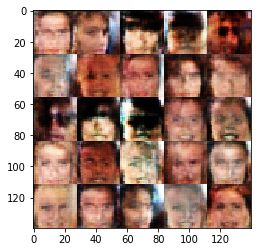

Epoch 3/5... Discriminator Loss: 1.0719... Generator Loss: 1.4701
Epoch 3/5... Discriminator Loss: 1.0706... Generator Loss: 1.9013
Epoch 3/5... Discriminator Loss: 0.9867... Generator Loss: 1.4782
Epoch 3/5... Discriminator Loss: 0.9755... Generator Loss: 2.0107
Epoch 3/5... Discriminator Loss: 1.0985... Generator Loss: 1.5659
Epoch 3/5... Discriminator Loss: 1.4478... Generator Loss: 1.4557
Epoch 3/5... Discriminator Loss: 1.4798... Generator Loss: 1.2488
Epoch 3/5... Discriminator Loss: 0.9428... Generator Loss: 1.2438
Epoch 3/5... Discriminator Loss: 1.0833... Generator Loss: 1.1921
Epoch 3/5... Discriminator Loss: 1.2879... Generator Loss: 1.1490


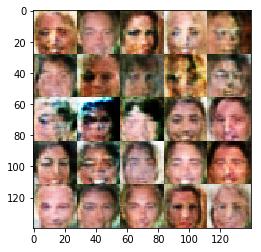

Epoch 3/5... Discriminator Loss: 0.6987... Generator Loss: 1.4577
Epoch 3/5... Discriminator Loss: 1.1197... Generator Loss: 1.3276
Epoch 3/5... Discriminator Loss: 1.0200... Generator Loss: 1.5159
Epoch 3/5... Discriminator Loss: 0.8751... Generator Loss: 1.4696
Epoch 3/5... Discriminator Loss: 1.2650... Generator Loss: 1.5504
Epoch 3/5... Discriminator Loss: 1.1339... Generator Loss: 1.1020
Epoch 3/5... Discriminator Loss: 1.5958... Generator Loss: 0.7310
Epoch 3/5... Discriminator Loss: 1.1205... Generator Loss: 1.1101
Epoch 3/5... Discriminator Loss: 1.2566... Generator Loss: 1.5679
Epoch 3/5... Discriminator Loss: 1.0185... Generator Loss: 1.6813


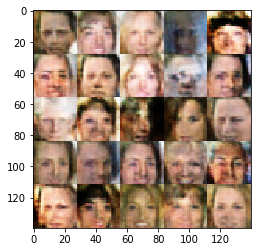

Epoch 3/5... Discriminator Loss: 1.2579... Generator Loss: 1.5242
Epoch 3/5... Discriminator Loss: 1.1001... Generator Loss: 1.1168
Epoch 3/5... Discriminator Loss: 1.0640... Generator Loss: 1.3775
Epoch 3/5... Discriminator Loss: 1.1284... Generator Loss: 1.4235
Epoch 3/5... Discriminator Loss: 1.4270... Generator Loss: 1.2236
Epoch 3/5... Discriminator Loss: 1.0678... Generator Loss: 1.6398
Epoch 3/5... Discriminator Loss: 0.9068... Generator Loss: 1.2998
Epoch 3/5... Discriminator Loss: 1.4633... Generator Loss: 1.5220
Epoch 3/5... Discriminator Loss: 1.1036... Generator Loss: 1.5413
Epoch 3/5... Discriminator Loss: 0.8982... Generator Loss: 1.3367


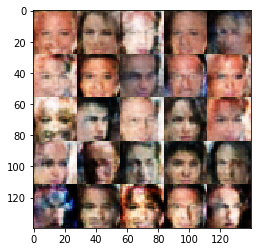

Epoch 3/5... Discriminator Loss: 0.8741... Generator Loss: 1.8317
Epoch 3/5... Discriminator Loss: 0.9505... Generator Loss: 0.9985
Epoch 3/5... Discriminator Loss: 0.9266... Generator Loss: 1.4472
Epoch 3/5... Discriminator Loss: 1.0558... Generator Loss: 1.2165
Epoch 3/5... Discriminator Loss: 0.8740... Generator Loss: 1.6220
Epoch 3/5... Discriminator Loss: 0.9459... Generator Loss: 1.3154
Epoch 3/5... Discriminator Loss: 1.2406... Generator Loss: 1.3831
Epoch 3/5... Discriminator Loss: 1.1860... Generator Loss: 1.1165
Epoch 3/5... Discriminator Loss: 0.6319... Generator Loss: 1.9397
Epoch 3/5... Discriminator Loss: 0.9806... Generator Loss: 1.2796


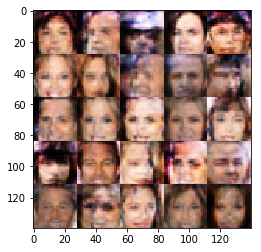

Epoch 3/5... Discriminator Loss: 1.0924... Generator Loss: 1.6428
Epoch 3/5... Discriminator Loss: 1.2290... Generator Loss: 1.4660
Epoch 3/5... Discriminator Loss: 1.3263... Generator Loss: 1.3634
Epoch 3/5... Discriminator Loss: 1.1213... Generator Loss: 1.4465
Epoch 3/5... Discriminator Loss: 1.0003... Generator Loss: 1.2337
Epoch 3/5... Discriminator Loss: 0.9240... Generator Loss: 1.5571
Epoch 3/5... Discriminator Loss: 1.0328... Generator Loss: 1.3320
Epoch 3/5... Discriminator Loss: 1.0597... Generator Loss: 1.4829
Epoch 3/5... Discriminator Loss: 1.0972... Generator Loss: 1.5710
Epoch 3/5... Discriminator Loss: 1.3587... Generator Loss: 2.1612


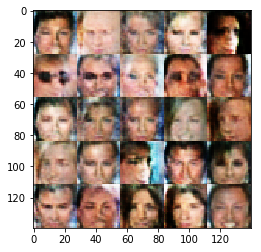

Epoch 3/5... Discriminator Loss: 0.9698... Generator Loss: 1.3912
Epoch 3/5... Discriminator Loss: 0.9302... Generator Loss: 1.4572
Epoch 3/5... Discriminator Loss: 0.8953... Generator Loss: 1.2989
Epoch 3/5... Discriminator Loss: 1.0990... Generator Loss: 1.2235
Epoch 3/5... Discriminator Loss: 0.9677... Generator Loss: 1.8277
Epoch 3/5... Discriminator Loss: 1.6977... Generator Loss: 1.6305
Epoch 3/5... Discriminator Loss: 1.1010... Generator Loss: 1.6833
Epoch 3/5... Discriminator Loss: 1.1023... Generator Loss: 1.2435
Epoch 3/5... Discriminator Loss: 1.2487... Generator Loss: 1.1717
Epoch 3/5... Discriminator Loss: 0.9194... Generator Loss: 1.2583


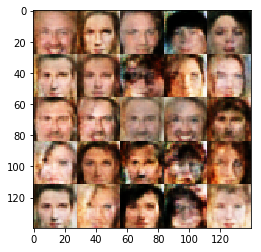

Epoch 3/5... Discriminator Loss: 1.1331... Generator Loss: 1.2338
Epoch 3/5... Discriminator Loss: 1.5372... Generator Loss: 1.2035
Epoch 3/5... Discriminator Loss: 1.3317... Generator Loss: 1.0386
Epoch 3/5... Discriminator Loss: 1.2054... Generator Loss: 1.4160
Epoch 3/5... Discriminator Loss: 1.2917... Generator Loss: 1.5473
Epoch 3/5... Discriminator Loss: 0.8899... Generator Loss: 1.7647
Epoch 3/5... Discriminator Loss: 1.3436... Generator Loss: 1.0922
Epoch 3/5... Discriminator Loss: 1.4002... Generator Loss: 1.3709
Epoch 3/5... Discriminator Loss: 1.1074... Generator Loss: 1.2197
Epoch 3/5... Discriminator Loss: 0.9552... Generator Loss: 1.4212


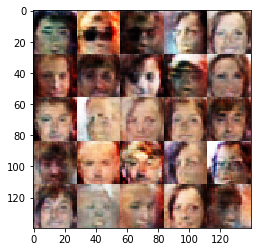

Epoch 3/5... Discriminator Loss: 1.5550... Generator Loss: 1.5486
Epoch 3/5... Discriminator Loss: 0.9178... Generator Loss: 1.0394
Epoch 3/5... Discriminator Loss: 1.4250... Generator Loss: 1.1321
Epoch 3/5... Discriminator Loss: 1.2100... Generator Loss: 1.3054
Epoch 3/5... Discriminator Loss: 1.4319... Generator Loss: 1.6073
Epoch 3/5... Discriminator Loss: 1.2328... Generator Loss: 1.1922
Epoch 3/5... Discriminator Loss: 1.0794... Generator Loss: 1.3484
Epoch 3/5... Discriminator Loss: 1.3282... Generator Loss: 1.0049
Epoch 3/5... Discriminator Loss: 0.9858... Generator Loss: 1.6671
Epoch 3/5... Discriminator Loss: 1.0206... Generator Loss: 1.6935


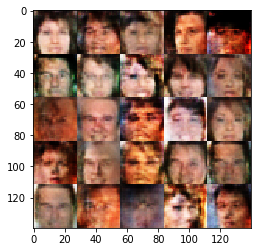

Epoch 3/5... Discriminator Loss: 1.1899... Generator Loss: 1.3866
Epoch 3/5... Discriminator Loss: 1.2522... Generator Loss: 1.1145
Epoch 3/5... Discriminator Loss: 1.2837... Generator Loss: 1.0265
Epoch 3/5... Discriminator Loss: 1.1958... Generator Loss: 1.6285
Epoch 3/5... Discriminator Loss: 1.4840... Generator Loss: 1.1841
Epoch 3/5... Discriminator Loss: 1.0443... Generator Loss: 1.3702
Epoch 3/5... Discriminator Loss: 1.3811... Generator Loss: 1.1011
Epoch 3/5... Discriminator Loss: 1.1470... Generator Loss: 1.4393
Epoch 3/5... Discriminator Loss: 0.5439... Generator Loss: 1.5868
Epoch 3/5... Discriminator Loss: 0.8038... Generator Loss: 0.9227


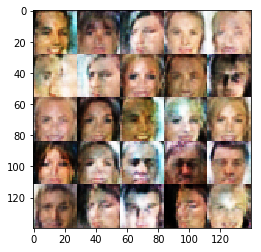

Epoch 3/5... Discriminator Loss: 1.1005... Generator Loss: 1.6789
Epoch 3/5... Discriminator Loss: 0.9612... Generator Loss: 1.8211
Epoch 3/5... Discriminator Loss: 1.1768... Generator Loss: 1.5135
Epoch 3/5... Discriminator Loss: 1.1195... Generator Loss: 1.9398
Epoch 3/5... Discriminator Loss: 0.8196... Generator Loss: 2.1660
Epoch 3/5... Discriminator Loss: 1.0901... Generator Loss: 1.1452
Epoch 3/5... Discriminator Loss: 0.8299... Generator Loss: 1.2913
Epoch 3/5... Discriminator Loss: 1.3906... Generator Loss: 1.3784
Epoch 3/5... Discriminator Loss: 1.5547... Generator Loss: 1.7286
Epoch 3/5... Discriminator Loss: 1.2031... Generator Loss: 1.0142


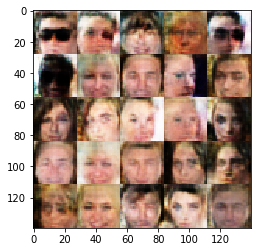

Epoch 3/5... Discriminator Loss: 0.9172... Generator Loss: 1.7630
Epoch 3/5... Discriminator Loss: 1.3851... Generator Loss: 1.3801
Epoch 3/5... Discriminator Loss: 1.0004... Generator Loss: 2.0805
Epoch 3/5... Discriminator Loss: 1.0275... Generator Loss: 1.5863
Epoch 3/5... Discriminator Loss: 1.1278... Generator Loss: 1.2391
Epoch 3/5... Discriminator Loss: 1.2285... Generator Loss: 1.2403
Epoch 3/5... Discriminator Loss: 1.1669... Generator Loss: 1.4254
Epoch 3/5... Discriminator Loss: 1.3367... Generator Loss: 1.1756
Epoch 3/5... Discriminator Loss: 1.3873... Generator Loss: 1.3004
Epoch 3/5... Discriminator Loss: 0.8212... Generator Loss: 1.5987


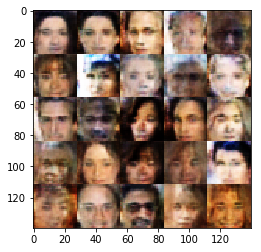

Epoch 3/5... Discriminator Loss: 0.8885... Generator Loss: 1.3332
Epoch 3/5... Discriminator Loss: 1.4226... Generator Loss: 1.4654
Epoch 3/5... Discriminator Loss: 1.3247... Generator Loss: 1.1778
Epoch 3/5... Discriminator Loss: 1.1035... Generator Loss: 1.6270
Epoch 3/5... Discriminator Loss: 1.5602... Generator Loss: 1.0068
Epoch 3/5... Discriminator Loss: 1.1688... Generator Loss: 1.3212
Epoch 3/5... Discriminator Loss: 0.9439... Generator Loss: 1.0850
Epoch 3/5... Discriminator Loss: 1.0774... Generator Loss: 1.3448
Epoch 3/5... Discriminator Loss: 1.3989... Generator Loss: 1.0394
Epoch 3/5... Discriminator Loss: 0.9849... Generator Loss: 1.4753


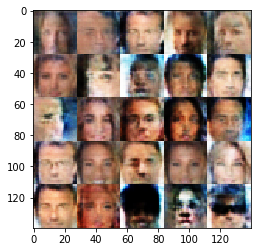

Epoch 3/5... Discriminator Loss: 1.1389... Generator Loss: 1.8555
Epoch 3/5... Discriminator Loss: 1.0656... Generator Loss: 1.2991
Epoch 3/5... Discriminator Loss: 1.0870... Generator Loss: 1.3218
Epoch 3/5... Discriminator Loss: 1.2198... Generator Loss: 1.1241
Epoch 3/5... Discriminator Loss: 1.2277... Generator Loss: 1.6163
Epoch 3/5... Discriminator Loss: 1.4475... Generator Loss: 1.3110
Epoch 3/5... Discriminator Loss: 0.8375... Generator Loss: 1.3716
Epoch 3/5... Discriminator Loss: 0.9706... Generator Loss: 1.7485
Epoch 3/5... Discriminator Loss: 0.8869... Generator Loss: 1.5458
Epoch 3/5... Discriminator Loss: 1.1943... Generator Loss: 1.2166


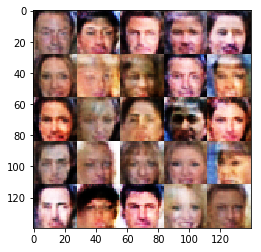

Epoch 3/5... Discriminator Loss: 1.3435... Generator Loss: 1.3320
Epoch 3/5... Discriminator Loss: 1.0694... Generator Loss: 1.5487
Epoch 3/5... Discriminator Loss: 1.4053... Generator Loss: 2.0610
Epoch 3/5... Discriminator Loss: 1.3372... Generator Loss: 1.0288
Epoch 3/5... Discriminator Loss: 1.4217... Generator Loss: 1.1218
Epoch 3/5... Discriminator Loss: 0.7982... Generator Loss: 1.2974
Epoch 3/5... Discriminator Loss: 0.8367... Generator Loss: 1.4305
Epoch 3/5... Discriminator Loss: 1.0345... Generator Loss: 1.4432
Epoch 3/5... Discriminator Loss: 1.0752... Generator Loss: 1.2786
Epoch 3/5... Discriminator Loss: 1.0570... Generator Loss: 1.6463


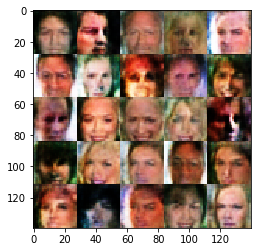

Epoch 3/5... Discriminator Loss: 1.0886... Generator Loss: 1.1860
Epoch 3/5... Discriminator Loss: 1.0337... Generator Loss: 1.8182
Epoch 3/5... Discriminator Loss: 1.1095... Generator Loss: 1.8598
Epoch 3/5... Discriminator Loss: 0.9434... Generator Loss: 1.6608
Epoch 3/5... Discriminator Loss: 1.2814... Generator Loss: 1.1707
Epoch 3/5... Discriminator Loss: 1.2066... Generator Loss: 1.2752
Epoch 3/5... Discriminator Loss: 1.2119... Generator Loss: 1.2900
Epoch 3/5... Discriminator Loss: 1.5318... Generator Loss: 1.2955
Epoch 3/5... Discriminator Loss: 1.1540... Generator Loss: 0.9702
Epoch 3/5... Discriminator Loss: 0.9096... Generator Loss: 1.3753


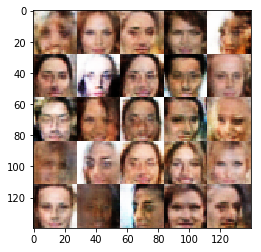

Epoch 3/5... Discriminator Loss: 1.1282... Generator Loss: 1.3119
Epoch 3/5... Discriminator Loss: 1.0890... Generator Loss: 1.5559
Epoch 3/5... Discriminator Loss: 0.8163... Generator Loss: 1.4401
Epoch 3/5... Discriminator Loss: 0.9623... Generator Loss: 1.9785
Epoch 3/5... Discriminator Loss: 0.6221... Generator Loss: 1.1797
Epoch 3/5... Discriminator Loss: 1.1036... Generator Loss: 1.2626
Epoch 3/5... Discriminator Loss: 1.1498... Generator Loss: 1.4700
Epoch 3/5... Discriminator Loss: 1.1913... Generator Loss: 1.7210
Epoch 3/5... Discriminator Loss: 0.8875... Generator Loss: 1.3697
Epoch 3/5... Discriminator Loss: 1.0735... Generator Loss: 1.3183


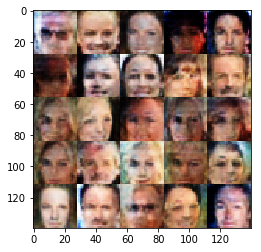

Epoch 3/5... Discriminator Loss: 1.0400... Generator Loss: 1.5749
Epoch 3/5... Discriminator Loss: 1.1011... Generator Loss: 1.3674
Epoch 3/5... Discriminator Loss: 1.1228... Generator Loss: 1.2811
Epoch 3/5... Discriminator Loss: 0.9994... Generator Loss: 1.7467
Epoch 3/5... Discriminator Loss: 1.0842... Generator Loss: 1.4574
Epoch 3/5... Discriminator Loss: 1.1612... Generator Loss: 1.7104
Epoch 3/5... Discriminator Loss: 1.0276... Generator Loss: 1.4493
Epoch 3/5... Discriminator Loss: 1.2054... Generator Loss: 1.3062
Epoch 3/5... Discriminator Loss: 0.7884... Generator Loss: 1.8703
Epoch 3/5... Discriminator Loss: 1.4037... Generator Loss: 1.2302


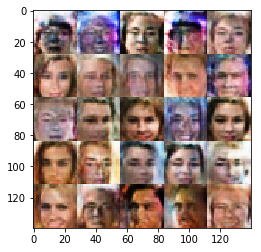

Epoch 3/5... Discriminator Loss: 1.1373... Generator Loss: 1.3203
Epoch 3/5... Discriminator Loss: 1.5205... Generator Loss: 1.2809
Epoch 3/5... Discriminator Loss: 1.3988... Generator Loss: 0.9919
Epoch 3/5... Discriminator Loss: 1.2082... Generator Loss: 1.1594
Epoch 3/5... Discriminator Loss: 0.8740... Generator Loss: 1.4112
Epoch 3/5... Discriminator Loss: 1.5494... Generator Loss: 1.2365
Epoch 3/5... Discriminator Loss: 0.9805... Generator Loss: 1.5736
Epoch 3/5... Discriminator Loss: 1.9012... Generator Loss: 0.9652
Epoch 3/5... Discriminator Loss: 1.2425... Generator Loss: 1.5138
Epoch 3/5... Discriminator Loss: 0.8568... Generator Loss: 1.3997


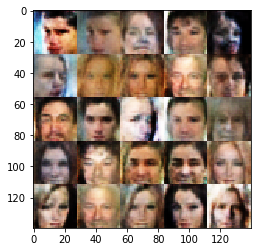

Epoch 3/5... Discriminator Loss: 1.4273... Generator Loss: 1.3104
Epoch 3/5... Discriminator Loss: 1.2174... Generator Loss: 1.4026
Epoch 3/5... Discriminator Loss: 1.1541... Generator Loss: 1.2774
Epoch 3/5... Discriminator Loss: 0.9427... Generator Loss: 1.7246
Epoch 3/5... Discriminator Loss: 1.0010... Generator Loss: 1.1874
Epoch 3/5... Discriminator Loss: 1.0310... Generator Loss: 1.2773
Epoch 3/5... Discriminator Loss: 1.2212... Generator Loss: 1.3893
Epoch 3/5... Discriminator Loss: 1.2332... Generator Loss: 1.2288
Epoch 3/5... Discriminator Loss: 0.9696... Generator Loss: 1.6567
Epoch 3/5... Discriminator Loss: 1.1537... Generator Loss: 1.5778


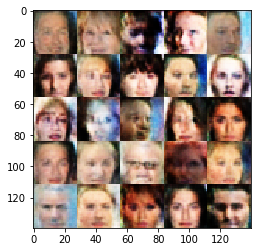

Epoch 3/5... Discriminator Loss: 1.7906... Generator Loss: 1.3059
Epoch 3/5... Discriminator Loss: 0.8103... Generator Loss: 1.7865
Epoch 3/5... Discriminator Loss: 0.9905... Generator Loss: 1.9208
Epoch 3/5... Discriminator Loss: 1.2856... Generator Loss: 1.0842
Epoch 3/5... Discriminator Loss: 1.2313... Generator Loss: 1.0586
Epoch 3/5... Discriminator Loss: 1.2241... Generator Loss: 1.4196
Epoch 3/5... Discriminator Loss: 0.8388... Generator Loss: 2.0636
Epoch 3/5... Discriminator Loss: 1.0825... Generator Loss: 1.1434
Epoch 3/5... Discriminator Loss: 1.1728... Generator Loss: 1.4820
Epoch 3/5... Discriminator Loss: 0.7300... Generator Loss: 1.9960


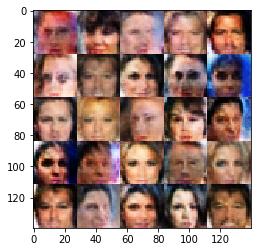

Epoch 3/5... Discriminator Loss: 1.3410... Generator Loss: 1.8070
Epoch 3/5... Discriminator Loss: 0.9530... Generator Loss: 1.5033
Epoch 3/5... Discriminator Loss: 1.2211... Generator Loss: 1.3629
Epoch 3/5... Discriminator Loss: 1.2914... Generator Loss: 1.6685
Epoch 3/5... Discriminator Loss: 1.1009... Generator Loss: 1.0775
Epoch 3/5... Discriminator Loss: 1.0301... Generator Loss: 1.4741
Epoch 3/5... Discriminator Loss: 0.8097... Generator Loss: 1.4362
Epoch 3/5... Discriminator Loss: 1.0566... Generator Loss: 1.4203
Epoch 3/5... Discriminator Loss: 0.9654... Generator Loss: 1.4768
Epoch 3/5... Discriminator Loss: 0.9726... Generator Loss: 1.9035


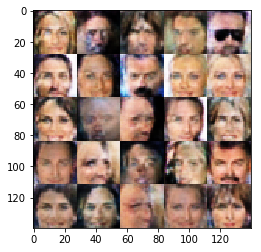

Epoch 3/5... Discriminator Loss: 0.9812... Generator Loss: 1.9006
Epoch 3/5... Discriminator Loss: 0.8690... Generator Loss: 1.6567
Epoch 3/5... Discriminator Loss: 1.1260... Generator Loss: 1.5124
Epoch 3/5... Discriminator Loss: 1.1351... Generator Loss: 1.2930
Epoch 3/5... Discriminator Loss: 1.0381... Generator Loss: 1.1605
Epoch 3/5... Discriminator Loss: 1.0365... Generator Loss: 1.3419
Epoch 3/5... Discriminator Loss: 0.9997... Generator Loss: 1.4343
Epoch 3/5... Discriminator Loss: 1.1832... Generator Loss: 1.2783
Epoch 3/5... Discriminator Loss: 1.0680... Generator Loss: 1.2471
Epoch 4/5... Discriminator Loss: 0.6250... Generator Loss: 1.4750


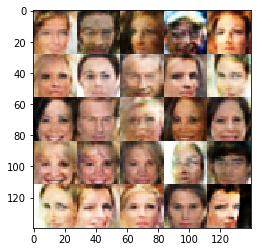

Epoch 4/5... Discriminator Loss: 0.9013... Generator Loss: 1.4267
Epoch 4/5... Discriminator Loss: 1.1480... Generator Loss: 1.2401
Epoch 4/5... Discriminator Loss: 1.1128... Generator Loss: 1.7607
Epoch 4/5... Discriminator Loss: 1.0208... Generator Loss: 1.6114
Epoch 4/5... Discriminator Loss: 1.2425... Generator Loss: 1.4532
Epoch 4/5... Discriminator Loss: 1.2010... Generator Loss: 1.5899
Epoch 4/5... Discriminator Loss: 1.4366... Generator Loss: 0.7547
Epoch 4/5... Discriminator Loss: 1.2124... Generator Loss: 1.7569
Epoch 4/5... Discriminator Loss: 1.2926... Generator Loss: 1.2548
Epoch 4/5... Discriminator Loss: 1.6634... Generator Loss: 0.9288


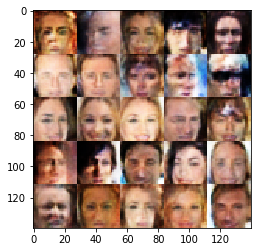

Epoch 4/5... Discriminator Loss: 1.2743... Generator Loss: 1.4576
Epoch 4/5... Discriminator Loss: 1.1865... Generator Loss: 1.4934
Epoch 4/5... Discriminator Loss: 1.6082... Generator Loss: 1.4077
Epoch 4/5... Discriminator Loss: 1.3005... Generator Loss: 1.1543
Epoch 4/5... Discriminator Loss: 1.0885... Generator Loss: 1.6912
Epoch 4/5... Discriminator Loss: 0.9733... Generator Loss: 1.6122
Epoch 4/5... Discriminator Loss: 1.7485... Generator Loss: 1.3200
Epoch 4/5... Discriminator Loss: 0.8446... Generator Loss: 1.5174
Epoch 4/5... Discriminator Loss: 0.7350... Generator Loss: 1.7128
Epoch 4/5... Discriminator Loss: 1.0112... Generator Loss: 1.7690


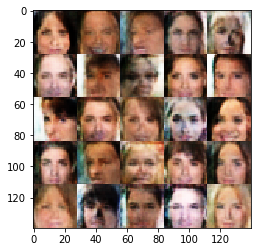

Epoch 4/5... Discriminator Loss: 0.8274... Generator Loss: 1.5763
Epoch 4/5... Discriminator Loss: 1.3086... Generator Loss: 1.4616
Epoch 4/5... Discriminator Loss: 0.7848... Generator Loss: 1.5573
Epoch 4/5... Discriminator Loss: 1.1384... Generator Loss: 1.2143
Epoch 4/5... Discriminator Loss: 1.4759... Generator Loss: 1.7765
Epoch 4/5... Discriminator Loss: 0.9310... Generator Loss: 0.9373
Epoch 4/5... Discriminator Loss: 1.0048... Generator Loss: 1.7931
Epoch 4/5... Discriminator Loss: 1.1564... Generator Loss: 1.3467
Epoch 4/5... Discriminator Loss: 1.2521... Generator Loss: 1.5664
Epoch 4/5... Discriminator Loss: 0.8591... Generator Loss: 1.3586


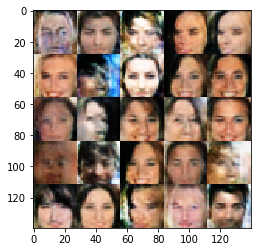

Epoch 4/5... Discriminator Loss: 0.7038... Generator Loss: 1.7549
Epoch 4/5... Discriminator Loss: 0.9050... Generator Loss: 1.6600
Epoch 4/5... Discriminator Loss: 1.3075... Generator Loss: 1.6916
Epoch 4/5... Discriminator Loss: 0.9461... Generator Loss: 1.3579
Epoch 4/5... Discriminator Loss: 1.1014... Generator Loss: 1.5884
Epoch 4/5... Discriminator Loss: 1.0386... Generator Loss: 1.3214
Epoch 4/5... Discriminator Loss: 0.7060... Generator Loss: 1.5683
Epoch 4/5... Discriminator Loss: 1.0628... Generator Loss: 1.5097
Epoch 4/5... Discriminator Loss: 1.1018... Generator Loss: 1.5567
Epoch 4/5... Discriminator Loss: 0.9253... Generator Loss: 1.4034


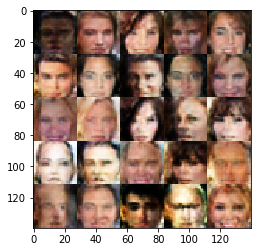

Epoch 4/5... Discriminator Loss: 1.1146... Generator Loss: 2.1821
Epoch 4/5... Discriminator Loss: 0.6291... Generator Loss: 2.0063
Epoch 4/5... Discriminator Loss: 0.9269... Generator Loss: 1.6805
Epoch 4/5... Discriminator Loss: 0.7287... Generator Loss: 1.5444
Epoch 4/5... Discriminator Loss: 1.2275... Generator Loss: 1.6238
Epoch 4/5... Discriminator Loss: 1.1044... Generator Loss: 1.6629
Epoch 4/5... Discriminator Loss: 1.2640... Generator Loss: 1.2529
Epoch 4/5... Discriminator Loss: 1.7071... Generator Loss: 1.2016
Epoch 4/5... Discriminator Loss: 1.1947... Generator Loss: 1.5613
Epoch 4/5... Discriminator Loss: 0.9945... Generator Loss: 1.3334


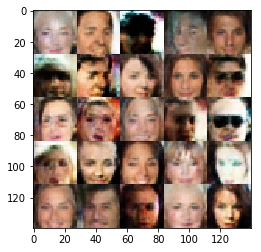

Epoch 4/5... Discriminator Loss: 1.0333... Generator Loss: 1.4195
Epoch 4/5... Discriminator Loss: 1.0860... Generator Loss: 1.2340
Epoch 4/5... Discriminator Loss: 0.8233... Generator Loss: 1.6817
Epoch 4/5... Discriminator Loss: 1.2686... Generator Loss: 1.3105
Epoch 4/5... Discriminator Loss: 1.0320... Generator Loss: 1.4617
Epoch 4/5... Discriminator Loss: 1.0256... Generator Loss: 1.4062
Epoch 4/5... Discriminator Loss: 0.6413... Generator Loss: 1.6365
Epoch 4/5... Discriminator Loss: 0.7619... Generator Loss: 2.0389
Epoch 4/5... Discriminator Loss: 0.7710... Generator Loss: 1.6736
Epoch 4/5... Discriminator Loss: 1.1815... Generator Loss: 1.2287


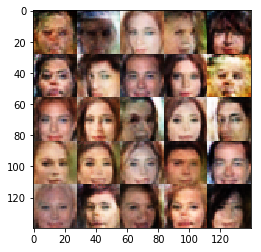

Epoch 4/5... Discriminator Loss: 1.1946... Generator Loss: 1.1749
Epoch 4/5... Discriminator Loss: 1.2796... Generator Loss: 1.1076
Epoch 4/5... Discriminator Loss: 1.2284... Generator Loss: 1.1434
Epoch 4/5... Discriminator Loss: 1.1380... Generator Loss: 2.6520
Epoch 4/5... Discriminator Loss: 0.5527... Generator Loss: 1.4275
Epoch 4/5... Discriminator Loss: 1.1205... Generator Loss: 1.9380
Epoch 4/5... Discriminator Loss: 0.9726... Generator Loss: 1.8456
Epoch 4/5... Discriminator Loss: 1.0085... Generator Loss: 1.9373
Epoch 4/5... Discriminator Loss: 1.0331... Generator Loss: 1.4352
Epoch 4/5... Discriminator Loss: 0.7565... Generator Loss: 1.6896


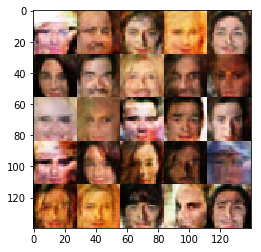

Epoch 4/5... Discriminator Loss: 1.4600... Generator Loss: 1.4293
Epoch 4/5... Discriminator Loss: 1.7071... Generator Loss: 1.4185
Epoch 4/5... Discriminator Loss: 1.8575... Generator Loss: 0.9362
Epoch 4/5... Discriminator Loss: 1.2287... Generator Loss: 1.7695
Epoch 4/5... Discriminator Loss: 1.3082... Generator Loss: 1.4912
Epoch 4/5... Discriminator Loss: 1.2811... Generator Loss: 1.7479
Epoch 4/5... Discriminator Loss: 1.2294... Generator Loss: 1.4312
Epoch 4/5... Discriminator Loss: 1.3599... Generator Loss: 1.2358
Epoch 4/5... Discriminator Loss: 1.0963... Generator Loss: 1.3062
Epoch 4/5... Discriminator Loss: 1.2704... Generator Loss: 1.5574


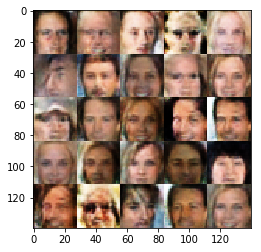

Epoch 4/5... Discriminator Loss: 1.1389... Generator Loss: 1.3341
Epoch 4/5... Discriminator Loss: 0.9218... Generator Loss: 1.6029
Epoch 4/5... Discriminator Loss: 1.3298... Generator Loss: 0.9213
Epoch 4/5... Discriminator Loss: 1.4917... Generator Loss: 1.7251
Epoch 4/5... Discriminator Loss: 1.2191... Generator Loss: 1.6492
Epoch 4/5... Discriminator Loss: 0.6628... Generator Loss: 2.1337
Epoch 4/5... Discriminator Loss: 0.8950... Generator Loss: 1.3958
Epoch 4/5... Discriminator Loss: 1.2700... Generator Loss: 1.5245
Epoch 4/5... Discriminator Loss: 0.8762... Generator Loss: 1.5322
Epoch 4/5... Discriminator Loss: 1.3226... Generator Loss: 1.3237


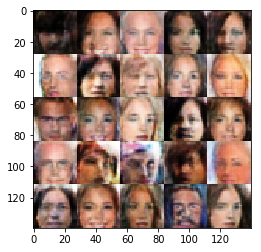

Epoch 4/5... Discriminator Loss: 0.8321... Generator Loss: 1.3743
Epoch 4/5... Discriminator Loss: 1.1494... Generator Loss: 1.4665
Epoch 4/5... Discriminator Loss: 1.1382... Generator Loss: 1.3747
Epoch 4/5... Discriminator Loss: 1.4333... Generator Loss: 1.2988
Epoch 4/5... Discriminator Loss: 1.0802... Generator Loss: 1.5577
Epoch 4/5... Discriminator Loss: 1.1914... Generator Loss: 1.4582
Epoch 4/5... Discriminator Loss: 0.7702... Generator Loss: 2.0513
Epoch 4/5... Discriminator Loss: 1.0061... Generator Loss: 1.4534
Epoch 4/5... Discriminator Loss: 0.6629... Generator Loss: 1.8138
Epoch 4/5... Discriminator Loss: 1.1182... Generator Loss: 1.2300


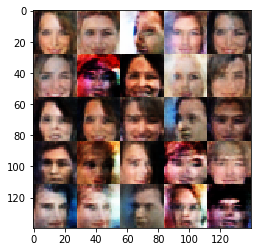

Epoch 4/5... Discriminator Loss: 1.0433... Generator Loss: 1.3822
Epoch 4/5... Discriminator Loss: 1.1342... Generator Loss: 1.1629
Epoch 4/5... Discriminator Loss: 0.9111... Generator Loss: 1.7009
Epoch 4/5... Discriminator Loss: 1.3608... Generator Loss: 1.1151
Epoch 4/5... Discriminator Loss: 1.2136... Generator Loss: 1.3075
Epoch 4/5... Discriminator Loss: 1.2106... Generator Loss: 1.8672
Epoch 4/5... Discriminator Loss: 0.8472... Generator Loss: 1.4767
Epoch 4/5... Discriminator Loss: 0.9346... Generator Loss: 1.2695
Epoch 4/5... Discriminator Loss: 0.9763... Generator Loss: 1.6916
Epoch 4/5... Discriminator Loss: 0.8553... Generator Loss: 1.7469


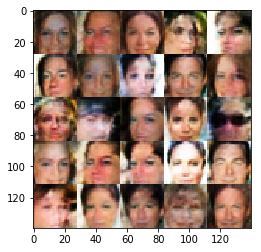

Epoch 4/5... Discriminator Loss: 1.3359... Generator Loss: 1.0216
Epoch 4/5... Discriminator Loss: 0.7885... Generator Loss: 1.9075
Epoch 4/5... Discriminator Loss: 1.3801... Generator Loss: 1.2160
Epoch 4/5... Discriminator Loss: 0.8552... Generator Loss: 1.3286
Epoch 4/5... Discriminator Loss: 0.9550... Generator Loss: 1.9553
Epoch 4/5... Discriminator Loss: 0.8701... Generator Loss: 1.5861
Epoch 4/5... Discriminator Loss: 0.8376... Generator Loss: 1.6287
Epoch 4/5... Discriminator Loss: 0.8980... Generator Loss: 2.0633
Epoch 4/5... Discriminator Loss: 0.7343... Generator Loss: 1.6414
Epoch 4/5... Discriminator Loss: 1.0506... Generator Loss: 1.8206


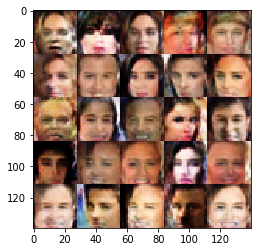

Epoch 4/5... Discriminator Loss: 1.1365... Generator Loss: 1.5722
Epoch 4/5... Discriminator Loss: 1.1428... Generator Loss: 1.4177
Epoch 4/5... Discriminator Loss: 0.7633... Generator Loss: 2.3803
Epoch 4/5... Discriminator Loss: 0.6435... Generator Loss: 2.3381
Epoch 4/5... Discriminator Loss: 0.7470... Generator Loss: 2.3734
Epoch 4/5... Discriminator Loss: 0.7904... Generator Loss: 1.8529
Epoch 4/5... Discriminator Loss: 0.9364... Generator Loss: 1.4560
Epoch 4/5... Discriminator Loss: 0.6736... Generator Loss: 2.1818
Epoch 4/5... Discriminator Loss: 0.9690... Generator Loss: 1.1372
Epoch 4/5... Discriminator Loss: 1.0594... Generator Loss: 1.5344


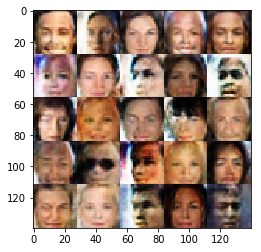

Epoch 4/5... Discriminator Loss: 0.6622... Generator Loss: 1.2593
Epoch 4/5... Discriminator Loss: 0.7493... Generator Loss: 1.5551
Epoch 4/5... Discriminator Loss: 0.8942... Generator Loss: 1.9812
Epoch 4/5... Discriminator Loss: 0.9369... Generator Loss: 1.5138
Epoch 4/5... Discriminator Loss: 0.7070... Generator Loss: 2.1341
Epoch 4/5... Discriminator Loss: 0.9571... Generator Loss: 1.9420
Epoch 4/5... Discriminator Loss: 1.0912... Generator Loss: 1.6155
Epoch 4/5... Discriminator Loss: 0.7615... Generator Loss: 1.4959
Epoch 4/5... Discriminator Loss: 1.0250... Generator Loss: 1.6273
Epoch 4/5... Discriminator Loss: 1.3325... Generator Loss: 1.2586


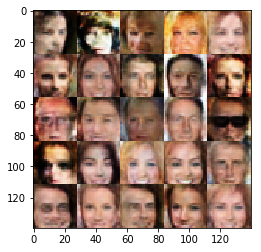

Epoch 4/5... Discriminator Loss: 0.8765... Generator Loss: 1.9767
Epoch 4/5... Discriminator Loss: 1.1057... Generator Loss: 1.4086
Epoch 4/5... Discriminator Loss: 0.7196... Generator Loss: 1.9240
Epoch 4/5... Discriminator Loss: 1.2919... Generator Loss: 1.7739
Epoch 4/5... Discriminator Loss: 0.9100... Generator Loss: 2.1916
Epoch 4/5... Discriminator Loss: 1.0160... Generator Loss: 1.3367
Epoch 4/5... Discriminator Loss: 0.6565... Generator Loss: 1.9833
Epoch 4/5... Discriminator Loss: 1.0556... Generator Loss: 1.8209
Epoch 4/5... Discriminator Loss: 0.9722... Generator Loss: 2.0624
Epoch 4/5... Discriminator Loss: 1.0525... Generator Loss: 1.2181


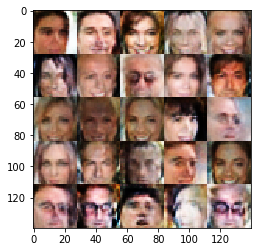

Epoch 4/5... Discriminator Loss: 1.0819... Generator Loss: 1.3502
Epoch 4/5... Discriminator Loss: 1.3106... Generator Loss: 1.8714
Epoch 4/5... Discriminator Loss: 1.1289... Generator Loss: 1.1518
Epoch 4/5... Discriminator Loss: 0.5785... Generator Loss: 1.9198
Epoch 4/5... Discriminator Loss: 0.8357... Generator Loss: 1.5808
Epoch 4/5... Discriminator Loss: 0.8953... Generator Loss: 1.2975
Epoch 4/5... Discriminator Loss: 1.2890... Generator Loss: 1.0992
Epoch 4/5... Discriminator Loss: 1.2188... Generator Loss: 0.9900
Epoch 4/5... Discriminator Loss: 1.1154... Generator Loss: 1.8762
Epoch 4/5... Discriminator Loss: 0.9122... Generator Loss: 1.3456


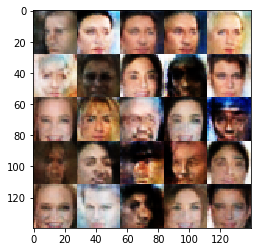

Epoch 4/5... Discriminator Loss: 1.4374... Generator Loss: 0.9790
Epoch 4/5... Discriminator Loss: 0.9015... Generator Loss: 1.7608
Epoch 4/5... Discriminator Loss: 1.2037... Generator Loss: 1.6852
Epoch 4/5... Discriminator Loss: 0.8975... Generator Loss: 2.0037
Epoch 4/5... Discriminator Loss: 1.1769... Generator Loss: 1.5234
Epoch 4/5... Discriminator Loss: 0.8869... Generator Loss: 1.4514
Epoch 4/5... Discriminator Loss: 0.8256... Generator Loss: 1.9374
Epoch 4/5... Discriminator Loss: 1.7918... Generator Loss: 1.8662
Epoch 4/5... Discriminator Loss: 0.9059... Generator Loss: 1.5440
Epoch 4/5... Discriminator Loss: 0.7487... Generator Loss: 1.7373


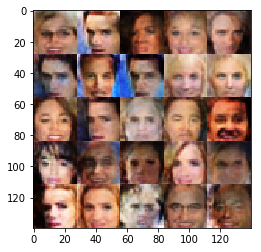

Epoch 4/5... Discriminator Loss: 1.2013... Generator Loss: 1.5420
Epoch 4/5... Discriminator Loss: 1.1747... Generator Loss: 1.7172
Epoch 4/5... Discriminator Loss: 1.0917... Generator Loss: 1.8303
Epoch 4/5... Discriminator Loss: 0.9210... Generator Loss: 1.3905
Epoch 4/5... Discriminator Loss: 1.1445... Generator Loss: 1.9099
Epoch 4/5... Discriminator Loss: 1.1273... Generator Loss: 1.5759
Epoch 4/5... Discriminator Loss: 0.7019... Generator Loss: 1.8266
Epoch 4/5... Discriminator Loss: 1.3842... Generator Loss: 1.7292
Epoch 4/5... Discriminator Loss: 0.9340... Generator Loss: 1.9754
Epoch 4/5... Discriminator Loss: 1.3364... Generator Loss: 1.4025


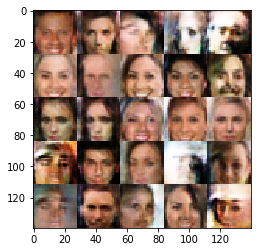

Epoch 4/5... Discriminator Loss: 1.0165... Generator Loss: 1.7814
Epoch 4/5... Discriminator Loss: 0.5335... Generator Loss: 1.8129
Epoch 4/5... Discriminator Loss: 1.0794... Generator Loss: 1.2945
Epoch 4/5... Discriminator Loss: 1.0317... Generator Loss: 1.7601
Epoch 4/5... Discriminator Loss: 1.0426... Generator Loss: 1.4499
Epoch 4/5... Discriminator Loss: 0.8539... Generator Loss: 1.6653
Epoch 4/5... Discriminator Loss: 1.1385... Generator Loss: 1.6539
Epoch 4/5... Discriminator Loss: 1.5281... Generator Loss: 1.5334
Epoch 4/5... Discriminator Loss: 1.3697... Generator Loss: 1.1305
Epoch 4/5... Discriminator Loss: 1.0726... Generator Loss: 1.3696


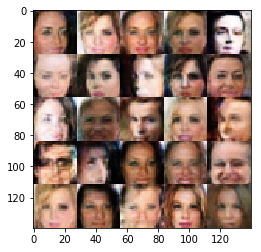

Epoch 4/5... Discriminator Loss: 1.1300... Generator Loss: 2.0322
Epoch 4/5... Discriminator Loss: 0.9597... Generator Loss: 1.3642
Epoch 4/5... Discriminator Loss: 0.7299... Generator Loss: 1.5711
Epoch 4/5... Discriminator Loss: 1.3165... Generator Loss: 1.4799
Epoch 4/5... Discriminator Loss: 1.0735... Generator Loss: 1.9326
Epoch 4/5... Discriminator Loss: 1.3094... Generator Loss: 0.9460
Epoch 4/5... Discriminator Loss: 1.2535... Generator Loss: 1.1532
Epoch 4/5... Discriminator Loss: 0.6493... Generator Loss: 1.8041
Epoch 4/5... Discriminator Loss: 1.1943... Generator Loss: 2.0834
Epoch 4/5... Discriminator Loss: 0.8896... Generator Loss: 1.5500


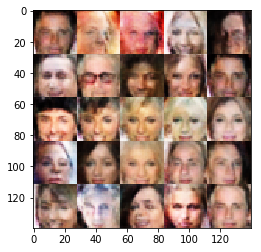

Epoch 4/5... Discriminator Loss: 1.2278... Generator Loss: 1.4277
Epoch 4/5... Discriminator Loss: 0.9971... Generator Loss: 1.5912
Epoch 4/5... Discriminator Loss: 0.7056... Generator Loss: 1.9076
Epoch 4/5... Discriminator Loss: 0.9400... Generator Loss: 1.3141
Epoch 4/5... Discriminator Loss: 1.1110... Generator Loss: 1.4478
Epoch 4/5... Discriminator Loss: 0.9662... Generator Loss: 2.1002
Epoch 4/5... Discriminator Loss: 1.2129... Generator Loss: 1.7211
Epoch 4/5... Discriminator Loss: 0.9401... Generator Loss: 1.7788
Epoch 4/5... Discriminator Loss: 1.2546... Generator Loss: 1.3868
Epoch 4/5... Discriminator Loss: 1.0051... Generator Loss: 1.1291


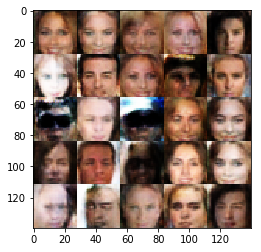

Epoch 4/5... Discriminator Loss: 0.6677... Generator Loss: 1.7565
Epoch 4/5... Discriminator Loss: 1.5116... Generator Loss: 1.9523
Epoch 4/5... Discriminator Loss: 0.7650... Generator Loss: 1.4689
Epoch 4/5... Discriminator Loss: 1.2434... Generator Loss: 1.2557
Epoch 4/5... Discriminator Loss: 0.6562... Generator Loss: 2.1782
Epoch 4/5... Discriminator Loss: 1.3803... Generator Loss: 1.7807
Epoch 4/5... Discriminator Loss: 1.0498... Generator Loss: 1.7289
Epoch 4/5... Discriminator Loss: 1.3500... Generator Loss: 1.4282
Epoch 4/5... Discriminator Loss: 1.1382... Generator Loss: 1.5573
Epoch 4/5... Discriminator Loss: 0.7646... Generator Loss: 2.2791


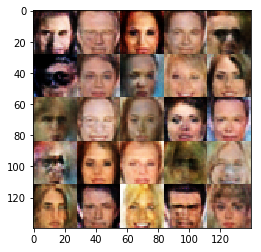

Epoch 4/5... Discriminator Loss: 0.8699... Generator Loss: 1.4744
Epoch 4/5... Discriminator Loss: 1.3877... Generator Loss: 1.1063
Epoch 4/5... Discriminator Loss: 1.3388... Generator Loss: 1.5364
Epoch 4/5... Discriminator Loss: 0.6623... Generator Loss: 1.6568
Epoch 4/5... Discriminator Loss: 0.9741... Generator Loss: 1.2476
Epoch 4/5... Discriminator Loss: 1.3231... Generator Loss: 1.8871
Epoch 4/5... Discriminator Loss: 0.8519... Generator Loss: 2.0094
Epoch 4/5... Discriminator Loss: 1.0318... Generator Loss: 1.8334
Epoch 4/5... Discriminator Loss: 1.4836... Generator Loss: 1.2000
Epoch 4/5... Discriminator Loss: 0.8146... Generator Loss: 1.6054


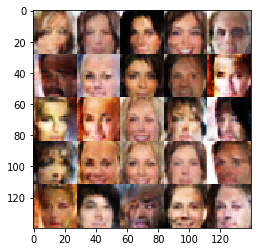

Epoch 4/5... Discriminator Loss: 1.1734... Generator Loss: 1.7376
Epoch 4/5... Discriminator Loss: 1.0227... Generator Loss: 1.5217
Epoch 4/5... Discriminator Loss: 1.2673... Generator Loss: 1.5567
Epoch 4/5... Discriminator Loss: 1.3921... Generator Loss: 1.1013
Epoch 4/5... Discriminator Loss: 0.8802... Generator Loss: 2.7573
Epoch 4/5... Discriminator Loss: 0.9868... Generator Loss: 1.5301
Epoch 4/5... Discriminator Loss: 1.1479... Generator Loss: 1.6871
Epoch 4/5... Discriminator Loss: 1.0116... Generator Loss: 1.3825
Epoch 4/5... Discriminator Loss: 1.3340... Generator Loss: 1.7621
Epoch 4/5... Discriminator Loss: 1.1902... Generator Loss: 1.5468


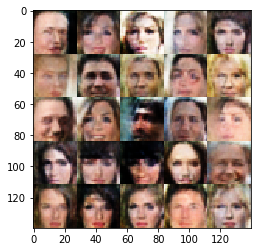

Epoch 4/5... Discriminator Loss: 1.0978... Generator Loss: 1.0058
Epoch 4/5... Discriminator Loss: 0.5074... Generator Loss: 2.2651
Epoch 4/5... Discriminator Loss: 0.9804... Generator Loss: 1.7947
Epoch 4/5... Discriminator Loss: 0.9555... Generator Loss: 2.1149
Epoch 4/5... Discriminator Loss: 1.1110... Generator Loss: 1.6338
Epoch 4/5... Discriminator Loss: 0.6101... Generator Loss: 1.9555
Epoch 4/5... Discriminator Loss: 0.8943... Generator Loss: 1.5660
Epoch 4/5... Discriminator Loss: 0.6600... Generator Loss: 1.8232
Epoch 4/5... Discriminator Loss: 1.0506... Generator Loss: 1.6049
Epoch 4/5... Discriminator Loss: 1.3561... Generator Loss: 1.6006


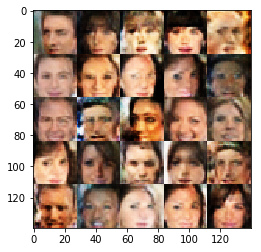

Epoch 4/5... Discriminator Loss: 0.7574... Generator Loss: 2.0300
Epoch 4/5... Discriminator Loss: 1.0745... Generator Loss: 1.4998
Epoch 5/5... Discriminator Loss: 1.2325... Generator Loss: 1.3599
Epoch 5/5... Discriminator Loss: 1.1613... Generator Loss: 1.3205
Epoch 5/5... Discriminator Loss: 1.0223... Generator Loss: 1.8429
Epoch 5/5... Discriminator Loss: 1.0041... Generator Loss: 1.6106
Epoch 5/5... Discriminator Loss: 0.9099... Generator Loss: 1.9222
Epoch 5/5... Discriminator Loss: 1.0184... Generator Loss: 1.5104
Epoch 5/5... Discriminator Loss: 0.9361... Generator Loss: 1.8493
Epoch 5/5... Discriminator Loss: 0.8980... Generator Loss: 1.6686


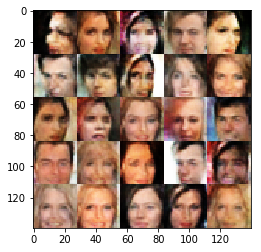

Epoch 5/5... Discriminator Loss: 1.2136... Generator Loss: 1.1166
Epoch 5/5... Discriminator Loss: 0.9780... Generator Loss: 1.4517
Epoch 5/5... Discriminator Loss: 1.1841... Generator Loss: 2.4549
Epoch 5/5... Discriminator Loss: 1.4090... Generator Loss: 1.8796
Epoch 5/5... Discriminator Loss: 1.2706... Generator Loss: 1.1495
Epoch 5/5... Discriminator Loss: 1.1929... Generator Loss: 1.2289
Epoch 5/5... Discriminator Loss: 1.1310... Generator Loss: 1.7161
Epoch 5/5... Discriminator Loss: 1.2034... Generator Loss: 2.0542
Epoch 5/5... Discriminator Loss: 0.9819... Generator Loss: 1.7102
Epoch 5/5... Discriminator Loss: 0.9423... Generator Loss: 1.3157


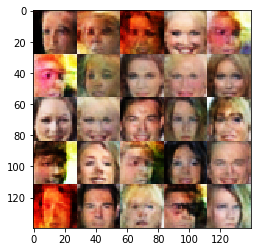

Epoch 5/5... Discriminator Loss: 1.4466... Generator Loss: 1.3231
Epoch 5/5... Discriminator Loss: 1.1812... Generator Loss: 2.2778
Epoch 5/5... Discriminator Loss: 0.9866... Generator Loss: 2.1861
Epoch 5/5... Discriminator Loss: 0.9533... Generator Loss: 1.3500
Epoch 5/5... Discriminator Loss: 1.1736... Generator Loss: 1.5998
Epoch 5/5... Discriminator Loss: 0.5646... Generator Loss: 1.2929
Epoch 5/5... Discriminator Loss: 1.2169... Generator Loss: 1.1493
Epoch 5/5... Discriminator Loss: 0.7610... Generator Loss: 2.2384
Epoch 5/5... Discriminator Loss: 1.5830... Generator Loss: 1.4279
Epoch 5/5... Discriminator Loss: 1.1539... Generator Loss: 1.5909


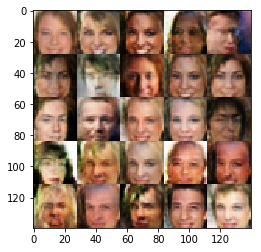

Epoch 5/5... Discriminator Loss: 1.5698... Generator Loss: 1.7010
Epoch 5/5... Discriminator Loss: 1.1362... Generator Loss: 1.0064
Epoch 5/5... Discriminator Loss: 1.3592... Generator Loss: 1.5732
Epoch 5/5... Discriminator Loss: 0.9822... Generator Loss: 2.4544
Epoch 5/5... Discriminator Loss: 0.6579... Generator Loss: 1.9901
Epoch 5/5... Discriminator Loss: 1.5235... Generator Loss: 1.1817
Epoch 5/5... Discriminator Loss: 1.1359... Generator Loss: 1.4964
Epoch 5/5... Discriminator Loss: 0.9093... Generator Loss: 1.8338
Epoch 5/5... Discriminator Loss: 1.1738... Generator Loss: 1.0846
Epoch 5/5... Discriminator Loss: 0.9638... Generator Loss: 1.2837


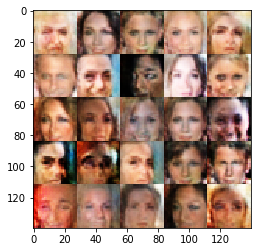

Epoch 5/5... Discriminator Loss: 1.1509... Generator Loss: 2.0851
Epoch 5/5... Discriminator Loss: 1.3869... Generator Loss: 0.9935
Epoch 5/5... Discriminator Loss: 1.1162... Generator Loss: 2.2017
Epoch 5/5... Discriminator Loss: 1.5661... Generator Loss: 1.2650
Epoch 5/5... Discriminator Loss: 1.2053... Generator Loss: 1.9116
Epoch 5/5... Discriminator Loss: 0.6796... Generator Loss: 1.4963
Epoch 5/5... Discriminator Loss: 1.1771... Generator Loss: 1.2908
Epoch 5/5... Discriminator Loss: 1.0695... Generator Loss: 1.8396
Epoch 5/5... Discriminator Loss: 0.8757... Generator Loss: 1.5451
Epoch 5/5... Discriminator Loss: 0.9504... Generator Loss: 1.5636


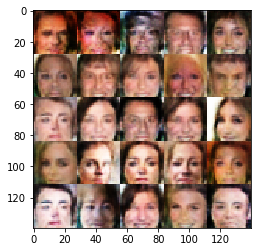

Epoch 5/5... Discriminator Loss: 1.2975... Generator Loss: 2.1190
Epoch 5/5... Discriminator Loss: 1.2179... Generator Loss: 1.3315
Epoch 5/5... Discriminator Loss: 0.8280... Generator Loss: 1.3912
Epoch 5/5... Discriminator Loss: 0.9728... Generator Loss: 1.2864
Epoch 5/5... Discriminator Loss: 1.1827... Generator Loss: 1.6250
Epoch 5/5... Discriminator Loss: 1.3475... Generator Loss: 0.9963
Epoch 5/5... Discriminator Loss: 1.4947... Generator Loss: 1.2971
Epoch 5/5... Discriminator Loss: 0.6094... Generator Loss: 2.0437
Epoch 5/5... Discriminator Loss: 0.9400... Generator Loss: 1.2403
Epoch 5/5... Discriminator Loss: 1.3211... Generator Loss: 1.8700


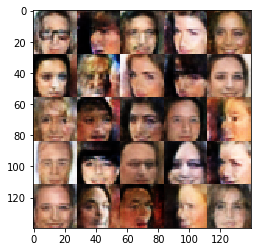

Epoch 5/5... Discriminator Loss: 0.6570... Generator Loss: 1.4920
Epoch 5/5... Discriminator Loss: 1.2927... Generator Loss: 1.3383
Epoch 5/5... Discriminator Loss: 1.1230... Generator Loss: 1.4306
Epoch 5/5... Discriminator Loss: 1.2767... Generator Loss: 1.4583
Epoch 5/5... Discriminator Loss: 0.8236... Generator Loss: 1.2705
Epoch 5/5... Discriminator Loss: 0.8773... Generator Loss: 1.7934
Epoch 5/5... Discriminator Loss: 1.3294... Generator Loss: 1.2807
Epoch 5/5... Discriminator Loss: 0.9856... Generator Loss: 1.8456
Epoch 5/5... Discriminator Loss: 1.1829... Generator Loss: 1.0666
Epoch 5/5... Discriminator Loss: 0.5760... Generator Loss: 2.2397


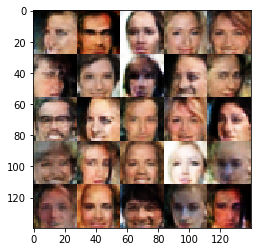

Epoch 5/5... Discriminator Loss: 0.8266... Generator Loss: 1.7510
Epoch 5/5... Discriminator Loss: 1.0566... Generator Loss: 2.1040
Epoch 5/5... Discriminator Loss: 0.5327... Generator Loss: 2.1414
Epoch 5/5... Discriminator Loss: 0.8442... Generator Loss: 1.6889
Epoch 5/5... Discriminator Loss: 1.3352... Generator Loss: 1.6585
Epoch 5/5... Discriminator Loss: 0.6299... Generator Loss: 1.8317
Epoch 5/5... Discriminator Loss: 0.8855... Generator Loss: 2.1642
Epoch 5/5... Discriminator Loss: 2.1069... Generator Loss: 1.5106
Epoch 5/5... Discriminator Loss: 1.2568... Generator Loss: 1.6435
Epoch 5/5... Discriminator Loss: 1.0447... Generator Loss: 1.5174


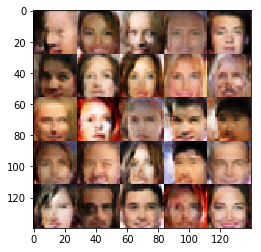

Epoch 5/5... Discriminator Loss: 1.2205... Generator Loss: 1.9103
Epoch 5/5... Discriminator Loss: 1.4347... Generator Loss: 1.4938
Epoch 5/5... Discriminator Loss: 0.4326... Generator Loss: 1.9511
Epoch 5/5... Discriminator Loss: 1.2501... Generator Loss: 1.4794
Epoch 5/5... Discriminator Loss: 0.9607... Generator Loss: 1.7379
Epoch 5/5... Discriminator Loss: 0.5482... Generator Loss: 2.0149
Epoch 5/5... Discriminator Loss: 0.7456... Generator Loss: 2.3000
Epoch 5/5... Discriminator Loss: 1.0508... Generator Loss: 1.7880
Epoch 5/5... Discriminator Loss: 1.5543... Generator Loss: 1.0622
Epoch 5/5... Discriminator Loss: 0.6789... Generator Loss: 1.7570


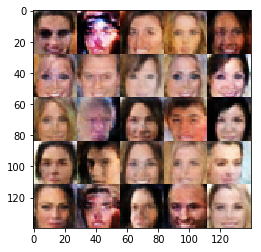

Epoch 5/5... Discriminator Loss: 0.8932... Generator Loss: 1.6189
Epoch 5/5... Discriminator Loss: 1.2122... Generator Loss: 1.2706
Epoch 5/5... Discriminator Loss: 0.8227... Generator Loss: 1.7074
Epoch 5/5... Discriminator Loss: 1.0032... Generator Loss: 2.1104
Epoch 5/5... Discriminator Loss: 1.0821... Generator Loss: 1.6252
Epoch 5/5... Discriminator Loss: 0.4254... Generator Loss: 1.9538
Epoch 5/5... Discriminator Loss: 1.2743... Generator Loss: 1.9263
Epoch 5/5... Discriminator Loss: 1.0289... Generator Loss: 2.0062
Epoch 5/5... Discriminator Loss: 0.6024... Generator Loss: 1.6199
Epoch 5/5... Discriminator Loss: 0.9936... Generator Loss: 2.0279


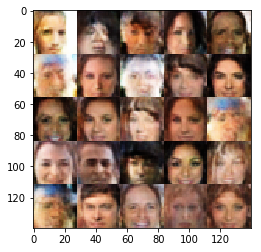

Epoch 5/5... Discriminator Loss: 0.7455... Generator Loss: 1.6362
Epoch 5/5... Discriminator Loss: 0.6465... Generator Loss: 1.7964
Epoch 5/5... Discriminator Loss: 0.9716... Generator Loss: 1.7765
Epoch 5/5... Discriminator Loss: 0.8093... Generator Loss: 1.7828
Epoch 5/5... Discriminator Loss: 1.5931... Generator Loss: 1.3346
Epoch 5/5... Discriminator Loss: 0.9891... Generator Loss: 1.1593
Epoch 5/5... Discriminator Loss: 0.8879... Generator Loss: 1.7655
Epoch 5/5... Discriminator Loss: 1.4643... Generator Loss: 1.2762
Epoch 5/5... Discriminator Loss: 1.1517... Generator Loss: 1.4639
Epoch 5/5... Discriminator Loss: 0.7156... Generator Loss: 1.5731


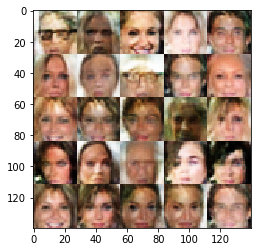

Epoch 5/5... Discriminator Loss: 1.1778... Generator Loss: 1.8877
Epoch 5/5... Discriminator Loss: 0.9634... Generator Loss: 1.5096
Epoch 5/5... Discriminator Loss: 1.2814... Generator Loss: 1.1482
Epoch 5/5... Discriminator Loss: 1.1357... Generator Loss: 1.7331
Epoch 5/5... Discriminator Loss: 1.0234... Generator Loss: 1.7850
Epoch 5/5... Discriminator Loss: 0.4874... Generator Loss: 1.6881
Epoch 5/5... Discriminator Loss: 0.6265... Generator Loss: 2.2911
Epoch 5/5... Discriminator Loss: 0.9624... Generator Loss: 1.9666
Epoch 5/5... Discriminator Loss: 1.4875... Generator Loss: 1.1131
Epoch 5/5... Discriminator Loss: 1.1120... Generator Loss: 1.0767


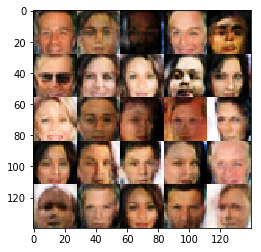

Epoch 5/5... Discriminator Loss: 0.6458... Generator Loss: 1.6829
Epoch 5/5... Discriminator Loss: 1.0545... Generator Loss: 1.8442
Epoch 5/5... Discriminator Loss: 0.8094... Generator Loss: 1.4886
Epoch 5/5... Discriminator Loss: 0.7898... Generator Loss: 1.6997
Epoch 5/5... Discriminator Loss: 1.1561... Generator Loss: 1.6393
Epoch 5/5... Discriminator Loss: 0.8681... Generator Loss: 1.8497
Epoch 5/5... Discriminator Loss: 0.8731... Generator Loss: 1.2046
Epoch 5/5... Discriminator Loss: 1.1471... Generator Loss: 1.6131
Epoch 5/5... Discriminator Loss: 0.9404... Generator Loss: 1.5045
Epoch 5/5... Discriminator Loss: 1.0604... Generator Loss: 1.6398


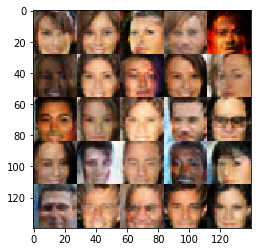

Epoch 5/5... Discriminator Loss: 0.8971... Generator Loss: 1.6184
Epoch 5/5... Discriminator Loss: 1.3676... Generator Loss: 1.6266
Epoch 5/5... Discriminator Loss: 1.2387... Generator Loss: 1.6018
Epoch 5/5... Discriminator Loss: 0.7339... Generator Loss: 2.2107
Epoch 5/5... Discriminator Loss: 1.1932... Generator Loss: 0.9656
Epoch 5/5... Discriminator Loss: 1.2830... Generator Loss: 1.5218
Epoch 5/5... Discriminator Loss: 1.0455... Generator Loss: 2.4072
Epoch 5/5... Discriminator Loss: 0.8629... Generator Loss: 2.2103
Epoch 5/5... Discriminator Loss: 0.8299... Generator Loss: 2.0910
Epoch 5/5... Discriminator Loss: 0.4049... Generator Loss: 2.7171


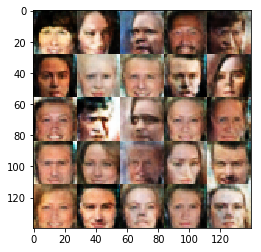

Epoch 5/5... Discriminator Loss: 1.1241... Generator Loss: 2.1981
Epoch 5/5... Discriminator Loss: 0.9071... Generator Loss: 1.6903
Epoch 5/5... Discriminator Loss: 0.8569... Generator Loss: 1.8508
Epoch 5/5... Discriminator Loss: 1.1781... Generator Loss: 1.7053
Epoch 5/5... Discriminator Loss: 0.9414... Generator Loss: 1.9040
Epoch 5/5... Discriminator Loss: 1.1247... Generator Loss: 1.2324
Epoch 5/5... Discriminator Loss: 1.2286... Generator Loss: 1.2134
Epoch 5/5... Discriminator Loss: 1.0391... Generator Loss: 1.8159
Epoch 5/5... Discriminator Loss: 0.8503... Generator Loss: 1.4115
Epoch 5/5... Discriminator Loss: 1.0860... Generator Loss: 1.4907


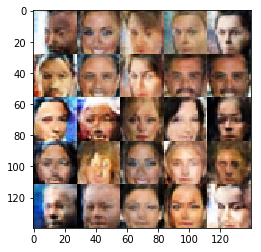

Epoch 5/5... Discriminator Loss: 1.9642... Generator Loss: 0.9549
Epoch 5/5... Discriminator Loss: 1.5320... Generator Loss: 1.1515
Epoch 5/5... Discriminator Loss: 0.6140... Generator Loss: 1.5619
Epoch 5/5... Discriminator Loss: 0.7390... Generator Loss: 1.7636
Epoch 5/5... Discriminator Loss: 1.3484... Generator Loss: 1.3997
Epoch 5/5... Discriminator Loss: 1.0546... Generator Loss: 1.6224
Epoch 5/5... Discriminator Loss: 1.1989... Generator Loss: 1.0419
Epoch 5/5... Discriminator Loss: 1.2125... Generator Loss: 1.7966
Epoch 5/5... Discriminator Loss: 0.9336... Generator Loss: 1.8114
Epoch 5/5... Discriminator Loss: 1.7364... Generator Loss: 1.3201


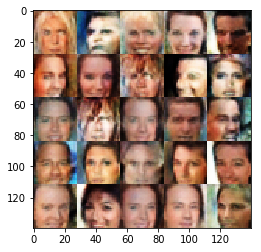

Epoch 5/5... Discriminator Loss: 0.7064... Generator Loss: 1.7718
Epoch 5/5... Discriminator Loss: 0.6596... Generator Loss: 2.0772
Epoch 5/5... Discriminator Loss: 1.3252... Generator Loss: 1.2946
Epoch 5/5... Discriminator Loss: 1.0556... Generator Loss: 1.7360
Epoch 5/5... Discriminator Loss: 1.3679... Generator Loss: 1.5947
Epoch 5/5... Discriminator Loss: 1.1181... Generator Loss: 1.1872
Epoch 5/5... Discriminator Loss: 1.4959... Generator Loss: 1.6738
Epoch 5/5... Discriminator Loss: 0.8968... Generator Loss: 1.8191
Epoch 5/5... Discriminator Loss: 0.9317... Generator Loss: 1.9287
Epoch 5/5... Discriminator Loss: 1.2151... Generator Loss: 1.5329


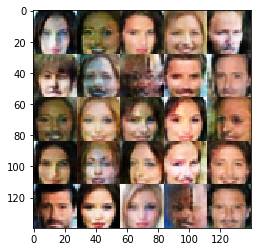

Epoch 5/5... Discriminator Loss: 0.5750... Generator Loss: 1.6619
Epoch 5/5... Discriminator Loss: 0.7829... Generator Loss: 1.9764
Epoch 5/5... Discriminator Loss: 1.1460... Generator Loss: 1.7898
Epoch 5/5... Discriminator Loss: 1.7999... Generator Loss: 1.2937
Epoch 5/5... Discriminator Loss: 0.7936... Generator Loss: 1.8718
Epoch 5/5... Discriminator Loss: 1.6916... Generator Loss: 1.6374
Epoch 5/5... Discriminator Loss: 0.8337... Generator Loss: 1.7010
Epoch 5/5... Discriminator Loss: 1.2876... Generator Loss: 1.1460
Epoch 5/5... Discriminator Loss: 1.3715... Generator Loss: 1.4131
Epoch 5/5... Discriminator Loss: 1.1645... Generator Loss: 1.3144


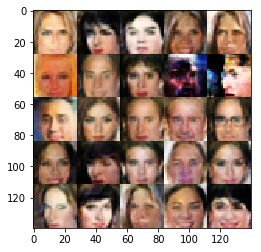

Epoch 5/5... Discriminator Loss: 1.2030... Generator Loss: 1.6899
Epoch 5/5... Discriminator Loss: 0.5203... Generator Loss: 1.4360
Epoch 5/5... Discriminator Loss: 1.0734... Generator Loss: 1.6496
Epoch 5/5... Discriminator Loss: 0.7945... Generator Loss: 1.9050
Epoch 5/5... Discriminator Loss: 1.1047... Generator Loss: 1.5289
Epoch 5/5... Discriminator Loss: 0.7761... Generator Loss: 1.9676
Epoch 5/5... Discriminator Loss: 0.7413... Generator Loss: 2.2890
Epoch 5/5... Discriminator Loss: 1.0333... Generator Loss: 1.5949
Epoch 5/5... Discriminator Loss: 0.9126... Generator Loss: 1.5530
Epoch 5/5... Discriminator Loss: 0.7512... Generator Loss: 2.0877


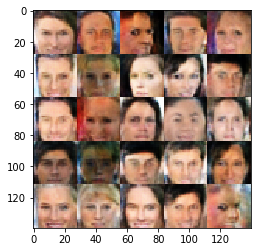

Epoch 5/5... Discriminator Loss: 0.8771... Generator Loss: 1.8033
Epoch 5/5... Discriminator Loss: 1.1536... Generator Loss: 1.6666
Epoch 5/5... Discriminator Loss: 0.9848... Generator Loss: 0.8723
Epoch 5/5... Discriminator Loss: 0.9378... Generator Loss: 2.4993
Epoch 5/5... Discriminator Loss: 0.9810... Generator Loss: 1.9785
Epoch 5/5... Discriminator Loss: 0.9142... Generator Loss: 1.9952
Epoch 5/5... Discriminator Loss: 1.4716... Generator Loss: 1.5073
Epoch 5/5... Discriminator Loss: 0.8451... Generator Loss: 1.1973
Epoch 5/5... Discriminator Loss: 0.7422... Generator Loss: 1.8674
Epoch 5/5... Discriminator Loss: 1.4540... Generator Loss: 1.2004


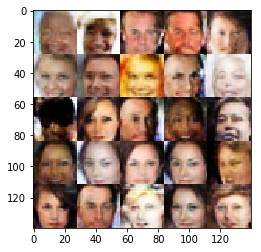

Epoch 5/5... Discriminator Loss: 1.4761... Generator Loss: 1.5859
Epoch 5/5... Discriminator Loss: 1.0391... Generator Loss: 0.9534
Epoch 5/5... Discriminator Loss: 0.7615... Generator Loss: 1.4208
Epoch 5/5... Discriminator Loss: 0.8352... Generator Loss: 1.7982
Epoch 5/5... Discriminator Loss: 1.1155... Generator Loss: 1.6248
Epoch 5/5... Discriminator Loss: 0.6138... Generator Loss: 1.7441
Epoch 5/5... Discriminator Loss: 1.1196... Generator Loss: 2.2058
Epoch 5/5... Discriminator Loss: 0.8215... Generator Loss: 2.0620
Epoch 5/5... Discriminator Loss: 0.6012... Generator Loss: 1.8212
Epoch 5/5... Discriminator Loss: 1.2679... Generator Loss: 1.7209


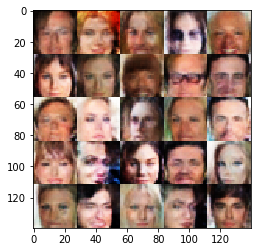

Epoch 5/5... Discriminator Loss: 1.3250... Generator Loss: 1.4793
Epoch 5/5... Discriminator Loss: 1.3237... Generator Loss: 1.6717
Epoch 5/5... Discriminator Loss: 1.0222... Generator Loss: 1.9071
Epoch 5/5... Discriminator Loss: 0.9661... Generator Loss: 1.3224
Epoch 5/5... Discriminator Loss: 1.0588... Generator Loss: 1.6024
Epoch 5/5... Discriminator Loss: 0.9434... Generator Loss: 1.6309
Epoch 5/5... Discriminator Loss: 0.6417... Generator Loss: 2.3157
Epoch 5/5... Discriminator Loss: 1.4104... Generator Loss: 2.4892
Epoch 5/5... Discriminator Loss: 0.8697... Generator Loss: 1.5130
Epoch 5/5... Discriminator Loss: 0.7549... Generator Loss: 1.8113


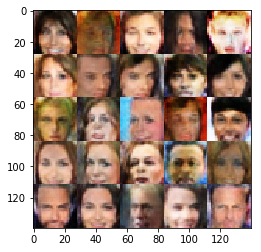

Epoch 5/5... Discriminator Loss: 0.9737... Generator Loss: 2.1485
Epoch 5/5... Discriminator Loss: 1.4332... Generator Loss: 1.1082
Epoch 5/5... Discriminator Loss: 0.5274... Generator Loss: 1.9805
Epoch 5/5... Discriminator Loss: 1.1412... Generator Loss: 1.6319
Epoch 5/5... Discriminator Loss: 1.2154... Generator Loss: 1.1606
Epoch 5/5... Discriminator Loss: 0.7074... Generator Loss: 2.1798
Epoch 5/5... Discriminator Loss: 1.2504... Generator Loss: 1.7080
Epoch 5/5... Discriminator Loss: 1.0296... Generator Loss: 2.2824
Epoch 5/5... Discriminator Loss: 0.9954... Generator Loss: 1.7686
Epoch 5/5... Discriminator Loss: 1.9342... Generator Loss: 1.4381


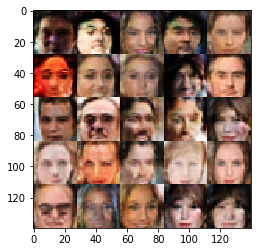

Epoch 5/5... Discriminator Loss: 0.6083... Generator Loss: 2.1411
Epoch 5/5... Discriminator Loss: 1.1155... Generator Loss: 2.7431
Epoch 5/5... Discriminator Loss: 1.1306... Generator Loss: 2.2041
Epoch 5/5... Discriminator Loss: 0.9448... Generator Loss: 2.3133
Epoch 5/5... Discriminator Loss: 0.9065... Generator Loss: 2.3929
Epoch 5/5... Discriminator Loss: 1.2301... Generator Loss: 1.1814
Epoch 5/5... Discriminator Loss: 1.1736... Generator Loss: 1.3122
Epoch 5/5... Discriminator Loss: 1.0436... Generator Loss: 1.6736
Epoch 5/5... Discriminator Loss: 1.1194... Generator Loss: 1.6678
Epoch 5/5... Discriminator Loss: 1.3894... Generator Loss: 2.1251


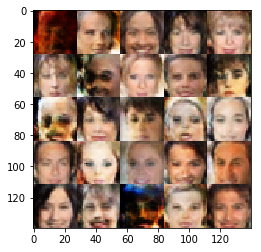

Epoch 5/5... Discriminator Loss: 1.3528... Generator Loss: 1.3469
Epoch 5/5... Discriminator Loss: 1.5322... Generator Loss: 1.9364
Epoch 5/5... Discriminator Loss: 1.5382... Generator Loss: 1.4448
Epoch 5/5... Discriminator Loss: 0.7643... Generator Loss: 2.9432
Epoch 5/5... Discriminator Loss: 0.9500... Generator Loss: 1.4502
Epoch 5/5... Discriminator Loss: 1.6951... Generator Loss: 1.5843
Epoch 5/5... Discriminator Loss: 1.0271... Generator Loss: 1.9700
Epoch 5/5... Discriminator Loss: 0.9651... Generator Loss: 1.8441
Epoch 5/5... Discriminator Loss: 0.9059... Generator Loss: 1.5658
Epoch 5/5... Discriminator Loss: 0.8690... Generator Loss: 1.2832


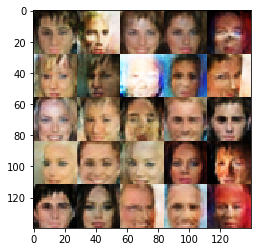

Epoch 5/5... Discriminator Loss: 0.9029... Generator Loss: 1.3075
Epoch 5/5... Discriminator Loss: 0.8313... Generator Loss: 1.8859
Epoch 5/5... Discriminator Loss: 0.8081... Generator Loss: 1.7639
Epoch 5/5... Discriminator Loss: 0.8109... Generator Loss: 2.1654
Epoch 5/5... Discriminator Loss: 0.8806... Generator Loss: 1.8603
Epoch 5/5... Discriminator Loss: 0.7156... Generator Loss: 2.0887
Final images:


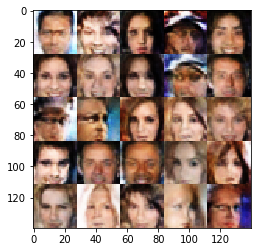

In [16]:
batch_size = 16
z_dim = 100
learning_rate = 0.0001
# Values like 0.1 to 0.3 have shown to get best results.
beta1 = 0.2

d_params = DParams(
    alpha=0.2, dropout_rate=0.1, minibatch_kernels=20, # dropout-rate
    conv_filters=[64, 128, 256],
    dense_layers=[512, 128, 32],
)

g_params = GParams(
    alpha=0.2, dropout_rate=0,
    conv_filters=[512, 256, 128],
    dense_layers=[64, 128, 256, 512],
)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.